In [32]:
# project uses the caltech101 dataset found here https://data.caltech.edu/records/mzrjq-6wc02

%pip install tensorflow
%pip install keras
%pip install matplotlib
%pip install tensorflow_datasets
%pip install numpy
%pip install seaborn
%pip install scikit-learn

import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator


Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [33]:
# Load dataset
train_data, val_data, test_data = tfds.load('caltech101', split=['train[:80%]', 'train[80%:]', 'test'], shuffle_files=True, as_supervised=True)

print(f"Training set size: {len(list(train_data))}")
print(f"Validation set size: {len(list(val_data))}")
print(f"Test set size: {len(list(test_data))}")

for image, label in train_data.take(1):
    print(f"Image shape: {image.shape}")
    print(f"Label: {label.numpy()}")

info = tfds.builder('caltech101').info
class_names = info.features['label'].names
print(f"Total classes: {len(class_names)}")



Training set size: 2448
Validation set size: 612
Test set size: 6084
Image shape: (297, 300, 3)
Label: 10
Total classes: 102


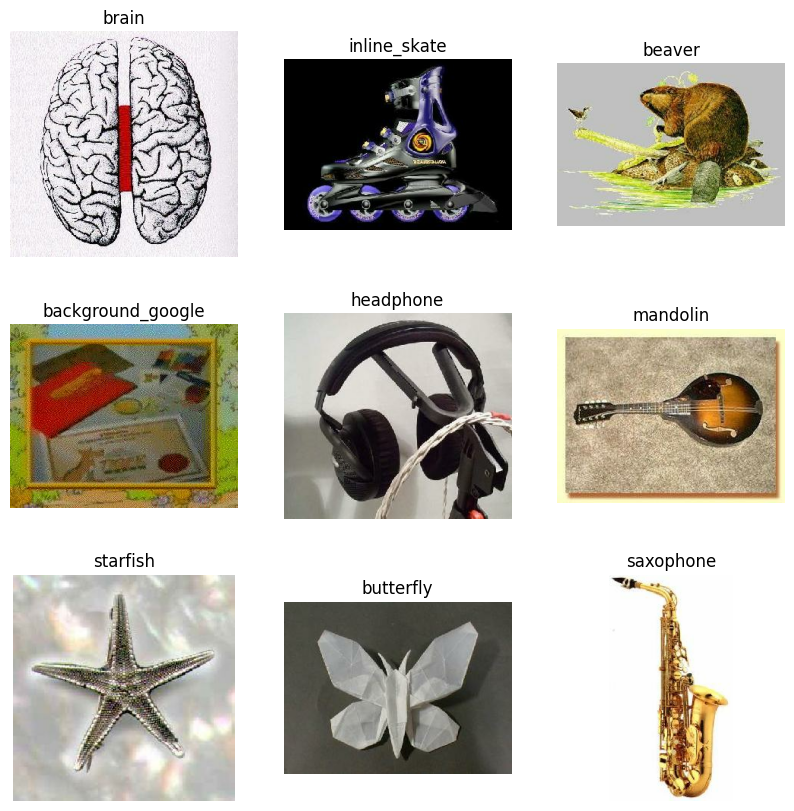

In [3]:
fig = plt.figure(figsize=(10, 10))
for i, (image, label) in enumerate(train_data.take(9)):
    ax = fig.add_subplot(3, 3, i + 1)
    ax.imshow(image.numpy())
    ax.set_title(class_names[label.numpy()])
    ax.axis('off')
plt.show()

In [4]:
# Counting instances per class
import collections
label_counts = collections.Counter([label.numpy() for _, label in train_data])
print(label_counts)


Counter({np.int64(54): 29, np.int64(46): 28, np.int64(16): 28, np.int64(47): 27, np.int64(40): 27, np.int64(52): 27, np.int64(58): 27, np.int64(72): 27, np.int64(98): 27, np.int64(96): 27, np.int64(55): 27, np.int64(29): 27, np.int64(27): 27, np.int64(100): 27, np.int64(21): 27, np.int64(94): 26, np.int64(43): 26, np.int64(15): 26, np.int64(74): 26, np.int64(59): 26, np.int64(30): 26, np.int64(84): 26, np.int64(75): 26, np.int64(20): 26, np.int64(0): 26, np.int64(51): 25, np.int64(7): 25, np.int64(45): 25, np.int64(97): 25, np.int64(36): 25, np.int64(73): 25, np.int64(17): 25, np.int64(44): 25, np.int64(65): 25, np.int64(81): 25, np.int64(31): 25, np.int64(77): 25, np.int64(89): 25, np.int64(83): 25, np.int64(4): 24, np.int64(13): 24, np.int64(70): 24, np.int64(8): 24, np.int64(92): 24, np.int64(23): 24, np.int64(25): 24, np.int64(39): 24, np.int64(50): 24, np.int64(12): 24, np.int64(9): 24, np.int64(28): 24, np.int64(91): 24, np.int64(53): 24, np.int64(3): 24, np.int64(68): 24, np.int

In [5]:
# Print all label names
print("Class Names:")
for i, class_name in enumerate(class_names):
    print(f"{i}: {class_name}")

Class Names:
0: accordion
1: airplanes
2: anchor
3: ant
4: background_google
5: barrel
6: bass
7: beaver
8: binocular
9: bonsai
10: brain
11: brontosaurus
12: buddha
13: butterfly
14: camera
15: cannon
16: car_side
17: ceiling_fan
18: cellphone
19: chair
20: chandelier
21: cougar_body
22: cougar_face
23: crab
24: crayfish
25: crocodile
26: crocodile_head
27: cup
28: dalmatian
29: dollar_bill
30: dolphin
31: dragonfly
32: electric_guitar
33: elephant
34: emu
35: euphonium
36: ewer
37: faces
38: faces_easy
39: ferry
40: flamingo
41: flamingo_head
42: garfield
43: gerenuk
44: gramophone
45: grand_piano
46: hawksbill
47: headphone
48: hedgehog
49: helicopter
50: ibis
51: inline_skate
52: joshua_tree
53: kangaroo
54: ketch
55: lamp
56: laptop
57: leopards
58: llama
59: lobster
60: lotus
61: mandolin
62: mayfly
63: menorah
64: metronome
65: minaret
66: motorbikes
67: nautilus
68: octopus
69: okapi
70: pagoda
71: panda
72: pigeon
73: pizza
74: platypus
75: pyramid
76: revolver
77: rhino
78: r

Training set size after filtering: 2424
Validation set size after filtering: 606


2024-10-31 11:50:31.451701: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Test set size after filtering: 5647
Image shape: (297, 300, 3)
Label: 10


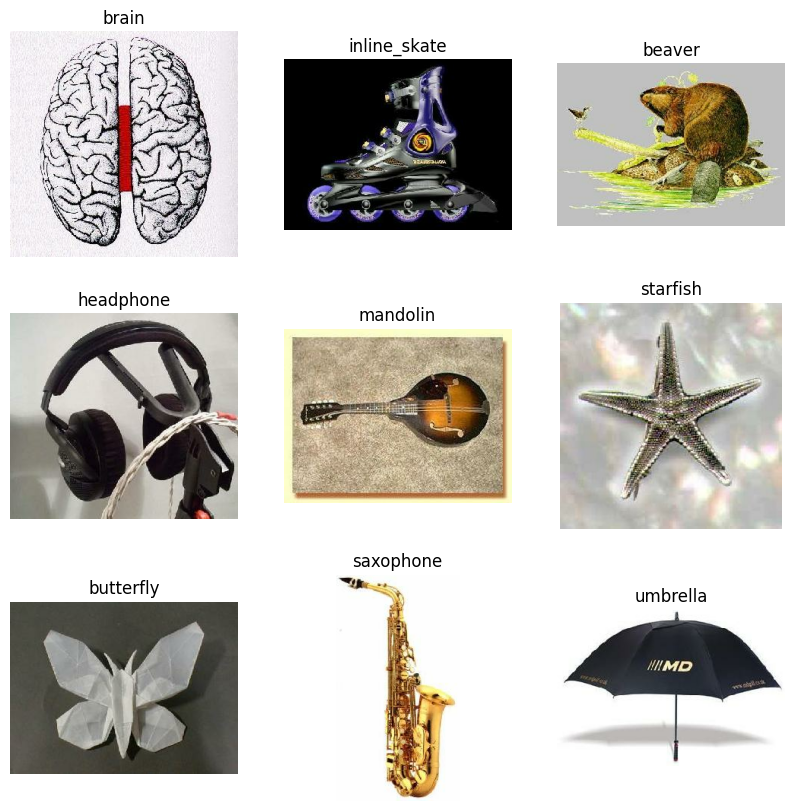

Counter({np.int64(54): 29, np.int64(46): 28, np.int64(16): 28, np.int64(47): 27, np.int64(40): 27, np.int64(52): 27, np.int64(58): 27, np.int64(72): 27, np.int64(98): 27, np.int64(96): 27, np.int64(55): 27, np.int64(29): 27, np.int64(27): 27, np.int64(100): 27, np.int64(21): 27, np.int64(94): 26, np.int64(43): 26, np.int64(15): 26, np.int64(74): 26, np.int64(59): 26, np.int64(30): 26, np.int64(84): 26, np.int64(75): 26, np.int64(20): 26, np.int64(0): 26, np.int64(51): 25, np.int64(7): 25, np.int64(45): 25, np.int64(97): 25, np.int64(36): 25, np.int64(73): 25, np.int64(17): 25, np.int64(44): 25, np.int64(65): 25, np.int64(81): 25, np.int64(31): 25, np.int64(77): 25, np.int64(89): 25, np.int64(83): 25, np.int64(13): 24, np.int64(70): 24, np.int64(8): 24, np.int64(92): 24, np.int64(23): 24, np.int64(25): 24, np.int64(39): 24, np.int64(50): 24, np.int64(12): 24, np.int64(9): 24, np.int64(28): 24, np.int64(91): 24, np.int64(53): 24, np.int64(3): 24, np.int64(68): 24, np.int64(69): 24, np.in

In [6]:
# Get class names and find the index of "google_background"
info = tfds.builder('caltech101').info
class_names = info.features['label'].names
google_background_index = class_names.index("background_google")

# Define a filter function to exclude "google_background"
def filter_google_background(image, label):
    return tf.not_equal(label, google_background_index)

# Apply the filter to each dataset split
train_data = train_data.filter(filter_google_background)
val_data = val_data.filter(filter_google_background)
test_data = test_data.filter(filter_google_background)

# Verifying the dataset sizes after filtering
print(f"Training set size after filtering: {len(list(train_data))}")
print(f"Validation set size after filtering: {len(list(val_data))}")
print(f"Test set size after filtering: {len(list(test_data))}")

# Print the first image and label from the filtered training set
for image, label in train_data.take(1):
    print(f"Image shape: {image.shape}")
    print(f"Label: {label.numpy()}")

# Visualize a few filtered images
fig = plt.figure(figsize=(10, 10))
for i, (image, label) in enumerate(train_data.take(9)):
    ax = fig.add_subplot(3, 3, i + 1)
    ax.imshow(image.numpy())
    ax.set_title(class_names[label.numpy()])
    ax.axis('off')
plt.show()

# Counting instances per class after filtering
label_counts = collections.Counter([label.numpy() for _, label in train_data])
print(label_counts)

In [7]:
# Resize images
def resize_image(image, label):
    image = tf.image.resize(image, [128, 128])
    return image, label

train_data = train_data.map(resize_image)
val_data = val_data.map(resize_image)
test_data = test_data.map(resize_image)

# Normalize images
def normalize_image(image, label):
    image = tf.cast(image, tf.float32) / 255.0
    return image, label

train_data = train_data.map(normalize_image)
val_data = val_data.map(normalize_image)
test_data = test_data.map(normalize_image)

# Data augmentation
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomRotation(0.1),
    tf.keras.layers.RandomContrast(0.3),
    tf.keras.layers.RandomZoom(0.15),
    tf.keras.layers.RandomTranslation(0.15, 0.15)
])

# Function to apply augmentation
def augment_image(image, label):
    image = data_augmentation(image)
    return image, label

# Function to expand training data with augmentation
def expand_training_data(train_data, n_augments):
    augmented_datasets = [train_data]  # Original data

    for _ in range(n_augments):
        augmented_data = train_data.map(augment_image)
        augmented_datasets.append(augmented_data)

    # Concatenate the original and augmented datasets
    full_train_data = augmented_datasets[0]
    for aug_data in augmented_datasets[1:]:
        full_train_data = full_train_data.concatenate(aug_data)

    return full_train_data

# Generate expanded training data
train_data = expand_training_data(train_data, n_augments=2)
train_data_size = len(list(train_data))
train_data = train_data.shuffle(buffer_size=train_data_size)

# Edge detection
def edge_detection(image, label):
    # Convert image to grayscale
    image_gray = tf.image.rgb_to_grayscale(image)
    # Add batch dimension to the grayscale image
    image_gray = tf.expand_dims(image_gray, axis=0)
    # Apply Sobel edge detection
    edges = tf.image.sobel_edges(image_gray)
    edge_x = edges[..., 0]
    edge_y = edges[..., 1]
    # Combine the edges
    edges = tf.sqrt(tf.square(edge_x) + tf.square(edge_y))
    # Remove the extra dimension
    edges = tf.squeeze(edges, axis=0)
    edges = tf.clip_by_value(edges, 0.0, 1.0)
    return edges, label

train_data = train_data.map(edge_detection)
val_data = val_data.map(edge_detection)
test_data = test_data.map(edge_detection)

# Apply batching and prefetching without one-hot encoding
train_data = train_data.batch(32, drop_remainder=True).prefetch(tf.data.AUTOTUNE)
val_data = val_data.batch(32, drop_remainder=True).prefetch(tf.data.AUTOTUNE)
test_data = test_data.batch(32, drop_remainder=True).prefetch(tf.data.AUTOTUNE)

In [8]:
print(f"Training set size: {len(list(train_data))}")
print(f"Validation set size: {len(list(val_data))}")
print(f"Test set size: {len(list(test_data))}")

for image, label in train_data.take(1):
    print(f"Image shape: {image.shape}")
    print(f"Label: {label.numpy()}")

Training set size: 227
Validation set size: 18


2024-10-31 11:50:49.660831: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Test set size: 176
Image shape: (32, 128, 128, 1)
Label: [ 77  87  24  54  90  12  32  26  77  20  25  36  70  39  79  93  15  22
  57  12 100  90  55  39  75  94  51  16  29  52  91  69]


In [30]:
import seaborn as sns

def print_results():
    # Extract test images and labels from the test dataset
    test_images, test_labels = zip(*[(image, label) for image, label in tfds.as_numpy(test_data)])
    test_images = np.array([image for batch in test_images for image in batch])
    test_labels = np.array([label for batch in test_labels for label in batch])

    # Generate predictions
    predictions = model.predict(test_images)
    predicted_classes = np.argmax(predictions, axis=1)

    # Calculate accuracy manually
    accuracy = np.sum(predicted_classes == test_labels) / len(test_labels)
    print(f"Accuracy: {accuracy * 100:.2f}%")

    # Calculate confusion matrix
    num_classes = len(class_names)
    confusion_matrix = np.zeros((num_classes, num_classes), dtype=int)

    for true, pred in zip(test_labels, predicted_classes):
        confusion_matrix[true, pred] += 1

    # Plot confusion matrix
    plt.figure(figsize=(20, 16))
    mask = confusion_matrix == 0  # Mask to avoid annotating zeroes
    sns.heatmap(confusion_matrix, annot=~mask, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names,
                cbar_kws={'label': 'Count'}, linewidths=0.5, linecolor='gray')
    plt.title("Confusion Matrix")
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.xticks(rotation=45, ha="right", fontsize=10)
    plt.yticks(fontsize=10)
    plt.tight_layout()
    plt.show()

    # Plot training history
    plt.plot(history.history['accuracy'], label='train_accuracy')
    plt.plot(history.history['val_accuracy'], label='val_accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(loc='lower right')
    plt.show()

In [28]:

def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

model = create_model()
model.compile(    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(train_data, epochs=10, validation_data=val_data)

print_results()


Epoch 1/10


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


    227/Unknown 34s 108ms/step - accuracy: 0.0290 - loss: 4.5214

/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


227/227 ━━━━━━━━━━━━━━━━━━━━ 35s 111ms/step - accuracy: 0.0291 - loss: 4.5204 - val_accuracy: 0.1628 - val_loss: 3.5335
Epoch 2/10


KeyboardInterrupt: 

176/176 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step
Accuracy: 29.55%


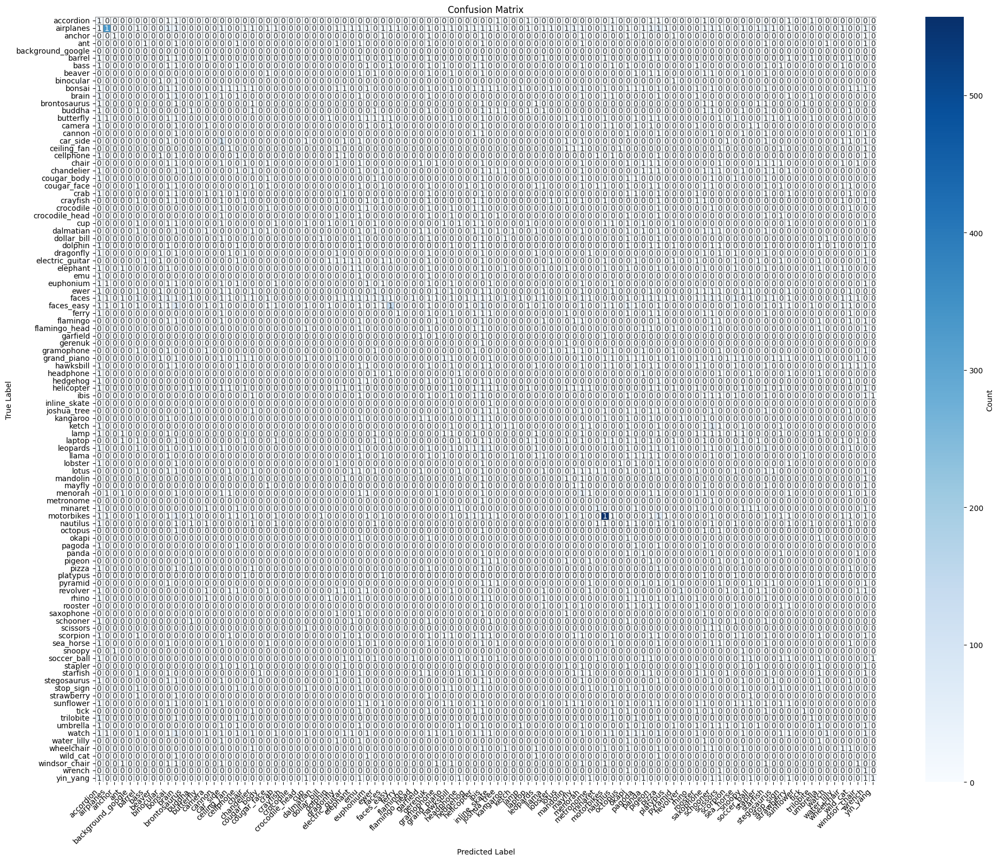

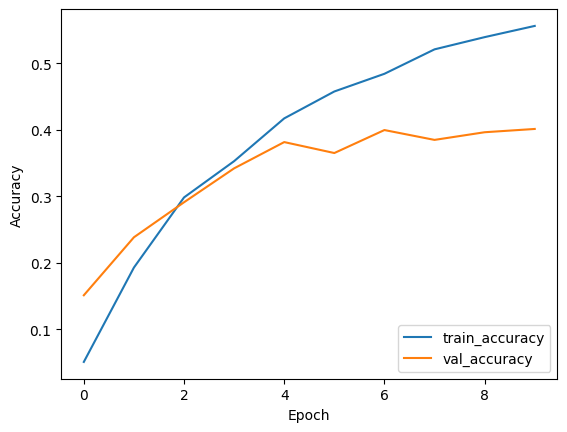

In [31]:
print_results()

Epoch 1/10


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
2024-10-30 22:45:26.661831: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6426 of 7272
2024-10-30 22:45:28.758025: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


    227/Unknown 55s 180ms/step - accuracy: 0.0147 - loss: 4.6156

/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


227/227 ━━━━━━━━━━━━━━━━━━━━ 56s 186ms/step - accuracy: 0.0148 - loss: 4.6154 - val_accuracy: 0.0280 - val_loss: 4.3171
Epoch 2/10


2024-10-30 22:46:21.132572: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6495 of 7272
2024-10-30 22:46:23.050386: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 54s 186ms/step - accuracy: 0.0510 - loss: 4.4118 - val_accuracy: 0.0970 - val_loss: 3.9218
Epoch 3/10


2024-10-30 22:47:15.313911: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6244 of 7272
2024-10-30 22:47:18.085198: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 56s 189ms/step - accuracy: 0.1270 - loss: 4.0022 - val_accuracy: 0.1497 - val_loss: 3.5950
Epoch 4/10


2024-10-30 22:48:11.078895: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6245 of 7272
2024-10-30 22:48:13.807566: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 55s 185ms/step - accuracy: 0.1834 - loss: 3.6447 - val_accuracy: 0.2368 - val_loss: 3.2008
Epoch 5/10


2024-10-30 22:49:05.969058: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6049 of 7272
2024-10-30 22:49:09.221204: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 57s 192ms/step - accuracy: 0.2409 - loss: 3.3389 - val_accuracy: 0.2730 - val_loss: 3.0291
Epoch 6/10


2024-10-30 22:50:02.875865: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6103 of 7272
2024-10-30 22:50:06.204662: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 56s 189ms/step - accuracy: 0.2894 - loss: 3.1220 - val_accuracy: 0.2845 - val_loss: 2.9215
Epoch 7/10


2024-10-30 22:50:59.343084: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6323 of 7272
2024-10-30 22:51:01.510071: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 55s 189ms/step - accuracy: 0.3316 - loss: 2.9565 - val_accuracy: 0.3141 - val_loss: 2.8047
Epoch 8/10


2024-10-30 22:51:54.359565: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6235 of 7272


  1/227 ━━━━━━━━━━━━━━━━━━━━ 48:24 13s/step - accuracy: 0.2812 - loss: 2.7445

2024-10-30 22:51:56.996914: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 55s 187ms/step - accuracy: 0.3623 - loss: 2.8158 - val_accuracy: 0.3454 - val_loss: 2.7309
Epoch 9/10


2024-10-30 22:52:49.565381: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6323 of 7272


  1/227 ━━━━━━━━━━━━━━━━━━━━ 47:08 13s/step - accuracy: 0.3125 - loss: 3.0281

2024-10-30 22:52:51.866835: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 55s 188ms/step - accuracy: 0.3886 - loss: 2.6954 - val_accuracy: 0.3405 - val_loss: 2.7047
Epoch 10/10


2024-10-30 22:53:44.663107: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6191 of 7272
2024-10-30 22:53:46.819291: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 55s 190ms/step - accuracy: 0.4105 - loss: 2.6151 - val_accuracy: 0.3569 - val_loss: 2.6161
176/176 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step
Accuracy: 56.11%


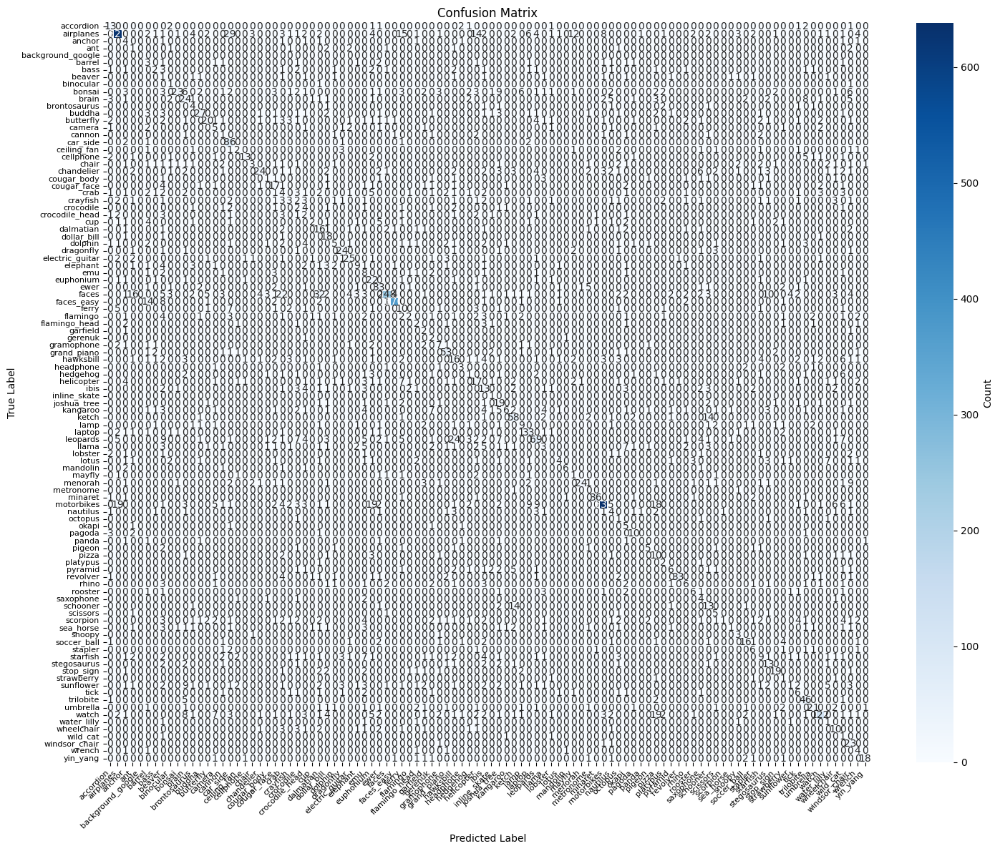

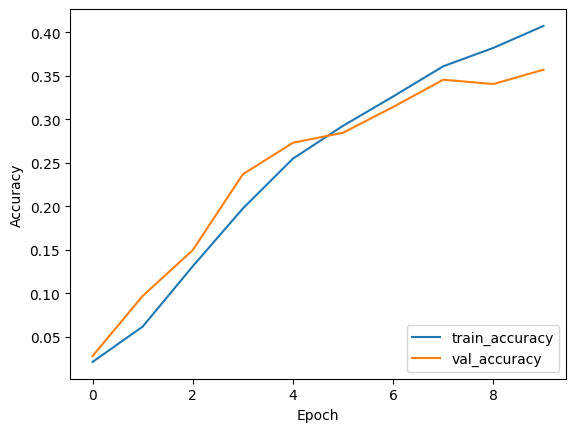

In [11]:

# model with slower learning rate
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

model = create_model()


model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(train_data, epochs=10, validation_data=val_data)

print_results()



Epoch 1/10


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
2024-10-30 22:55:24.343423: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6689 of 7272
2024-10-30 22:55:25.810141: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


    227/Unknown 53s 178ms/step - accuracy: 0.0102 - loss: 6.0982

/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


227/227 ━━━━━━━━━━━━━━━━━━━━ 54s 183ms/step - accuracy: 0.0102 - loss: 6.0929 - val_accuracy: 0.0033 - val_loss: 4.3971
Epoch 2/10


2024-10-30 22:56:17.762760: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6697 of 7272
2024-10-30 22:56:19.327524: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - accuracy: 0.0083 - loss: 4.6189 - val_accuracy: 0.0016 - val_loss: 4.4065
Epoch 3/10


2024-10-30 22:57:03.351630: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6579 of 7272
2024-10-30 22:57:05.218796: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - accuracy: 0.0114 - loss: 4.6185

2024-10-30 22:57:45.783394: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


227/227 ━━━━━━━━━━━━━━━━━━━━ 53s 182ms/step - accuracy: 0.0114 - loss: 4.6184 - val_accuracy: 0.0049 - val_loss: 4.4103
Epoch 4/10


2024-10-30 22:57:56.806800: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6471 of 7272
2024-10-30 22:57:58.765489: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 52s 173ms/step - accuracy: 0.0134 - loss: 4.6150 - val_accuracy: 0.0016 - val_loss: 4.4076
Epoch 5/10


2024-10-30 22:58:48.406442: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6476 of 7272
2024-10-30 22:58:50.233497: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 50s 169ms/step - accuracy: 0.0108 - loss: 4.6164 - val_accuracy: 0.0016 - val_loss: 4.4095
Epoch 6/10


2024-10-30 22:59:38.674552: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6600 of 7272
2024-10-30 22:59:40.325803: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 50s 166ms/step - accuracy: 0.0112 - loss: 4.6162 - val_accuracy: 0.0016 - val_loss: 4.4091
Epoch 7/10


2024-10-30 23:00:28.184436: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6612 of 7272
2024-10-30 23:00:29.748273: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 50s 168ms/step - accuracy: 0.0094 - loss: 4.6143 - val_accuracy: 0.0016 - val_loss: 4.4079
Epoch 8/10


2024-10-30 23:01:17.951138: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6533 of 7272
2024-10-30 23:01:19.442588: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - accuracy: 0.0154 - loss: 4.6138 - val_accuracy: 0.0033 - val_loss: 4.4049
Epoch 9/10


2024-10-30 23:02:07.095000: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6724 of 7272
2024-10-30 23:02:08.014966: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 51s 174ms/step - accuracy: 0.0102 - loss: 4.6160 - val_accuracy: 0.0033 - val_loss: 4.4074
Epoch 10/10


2024-10-30 23:02:57.743823: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6928 of 7272
2024-10-30 23:02:58.571922: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 50s 173ms/step - accuracy: 0.0108 - loss: 4.6161 - val_accuracy: 0.0016 - val_loss: 4.4085
176/176 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step
Accuracy: 1.47%


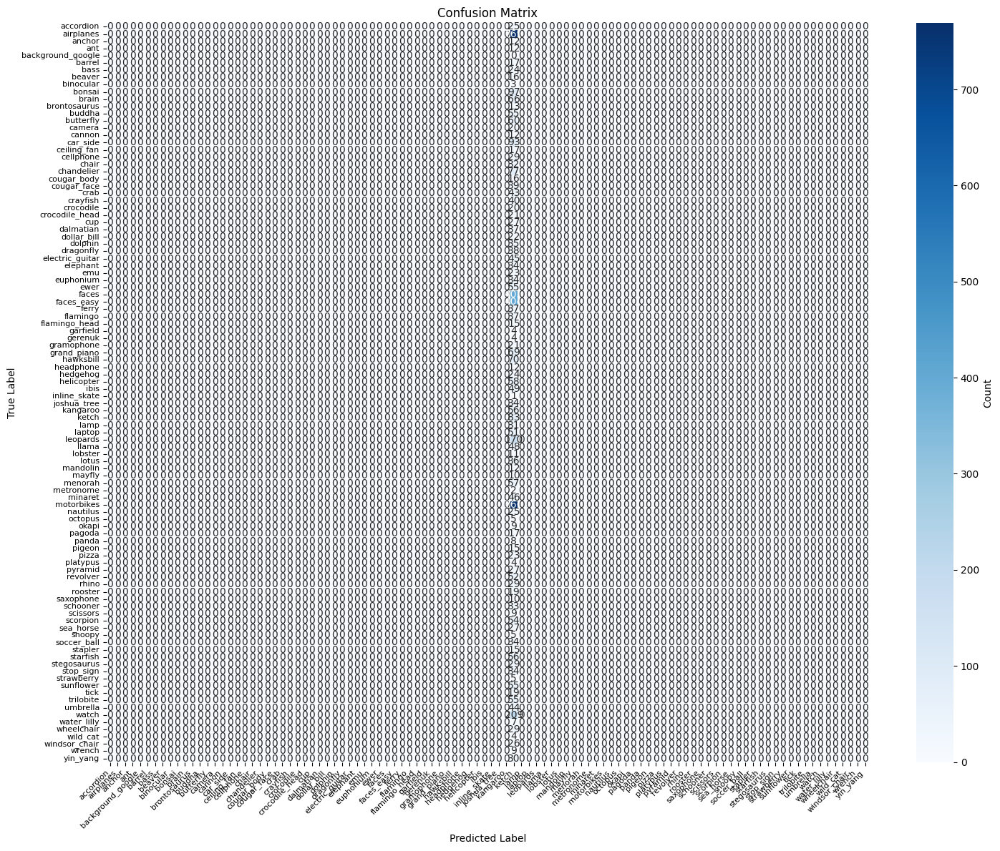

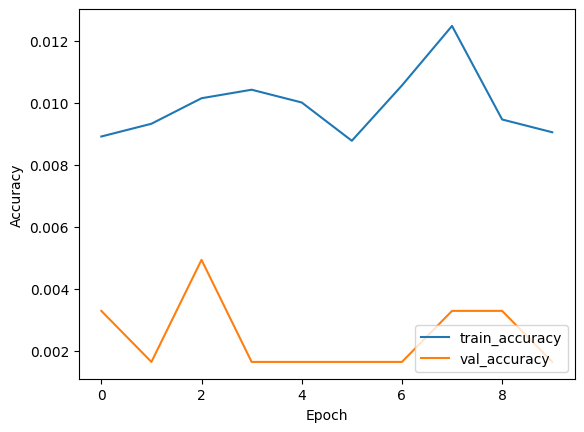

In [12]:

# model with faster learning rate
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

model = create_model()
# larger learning rate
model.compile(    optimizer=tf.keras.optimizers.Adam(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(train_data, epochs=10, validation_data=val_data)

print_results()


Epoch 1/10


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
2024-10-30 23:04:04.987336: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6625 of 7272
2024-10-30 23:04:06.431284: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


    227/Unknown 50s 164ms/step - accuracy: 0.0179 - loss: 4.5900

/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


227/227 ━━━━━━━━━━━━━━━━━━━━ 51s 169ms/step - accuracy: 0.0180 - loss: 4.5894 - val_accuracy: 0.0789 - val_loss: 3.9316
Epoch 2/10


2024-10-30 23:04:54.864605: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6414 of 7272
2024-10-30 23:04:56.896071: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 51s 169ms/step - accuracy: 0.1128 - loss: 3.9565 - val_accuracy: 0.2171 - val_loss: 3.2662
Epoch 3/10


2024-10-30 23:05:45.502495: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6351 of 7272
2024-10-30 23:05:47.720897: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 51s 171ms/step - accuracy: 0.2058 - loss: 3.3877 - val_accuracy: 0.2812 - val_loss: 2.9217
Epoch 4/10


2024-10-30 23:06:36.721360: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6557 of 7272
2024-10-30 23:06:38.337395: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 50s 171ms/step - accuracy: 0.2741 - loss: 3.0707 - val_accuracy: 0.3322 - val_loss: 2.7434
Epoch 5/10


2024-10-30 23:07:27.123940: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6883 of 7272
2024-10-30 23:07:27.857041: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 51s 175ms/step - accuracy: 0.3238 - loss: 2.8227 - val_accuracy: 0.3717 - val_loss: 2.5395
Epoch 6/10


2024-10-30 23:08:17.631804: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6834 of 7272
2024-10-30 23:08:18.686565: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 51s 174ms/step - accuracy: 0.3614 - loss: 2.6347 - val_accuracy: 0.3947 - val_loss: 2.4816
Epoch 7/10


2024-10-30 23:09:08.287903: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6873 of 7272
2024-10-30 23:09:09.233526: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 50s 173ms/step - accuracy: 0.4109 - loss: 2.4839 - val_accuracy: 0.4013 - val_loss: 2.4697
Epoch 8/10


2024-10-30 23:09:58.692421: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6738 of 7272
2024-10-30 23:09:59.893489: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 50s 169ms/step - accuracy: 0.4275 - loss: 2.3739 - val_accuracy: 0.4112 - val_loss: 2.4301
Epoch 9/10


2024-10-30 23:10:48.460925: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6766 of 7272
2024-10-30 23:10:49.574905: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 50s 171ms/step - accuracy: 0.4495 - loss: 2.2746 - val_accuracy: 0.4013 - val_loss: 2.3937
Epoch 10/10


2024-10-30 23:11:38.616198: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:79: Filling up shuffle buffer (this may take a while): 6680 of 7272
2024-10-30 23:11:39.898575: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


227/227 ━━━━━━━━━━━━━━━━━━━━ 50s 170ms/step - accuracy: 0.4590 - loss: 2.2308 - val_accuracy: 0.4211 - val_loss: 2.3432
176/176 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step
Accuracy: 57.30%


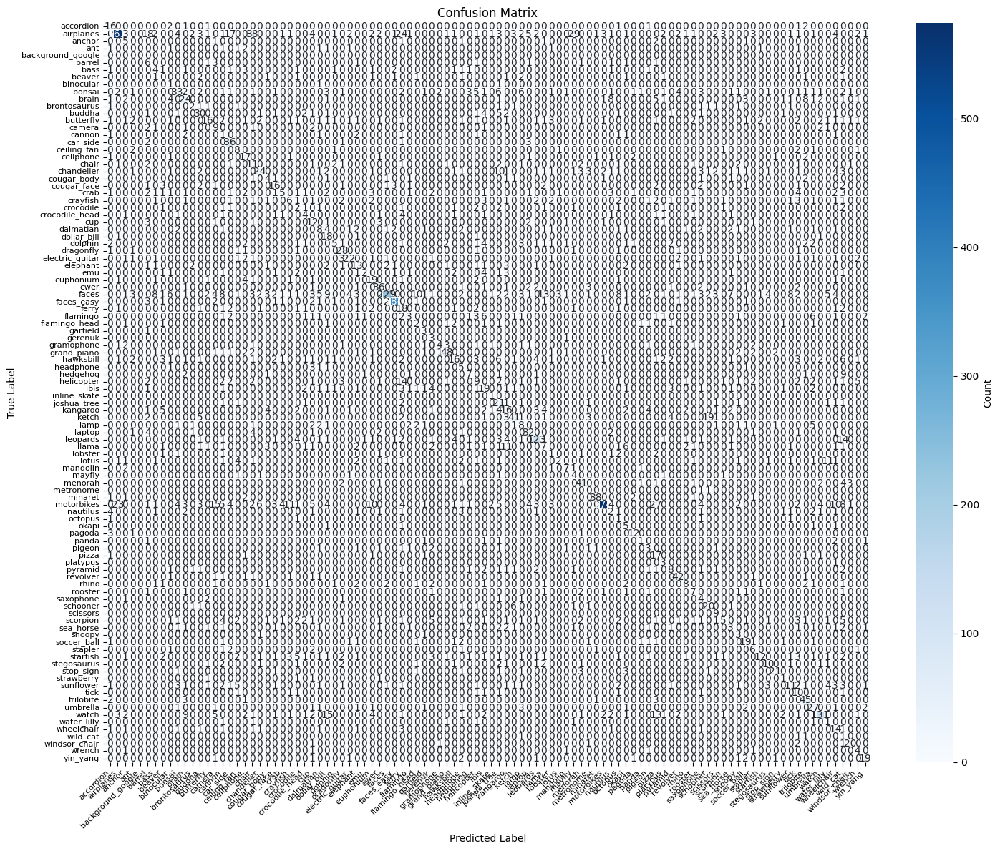

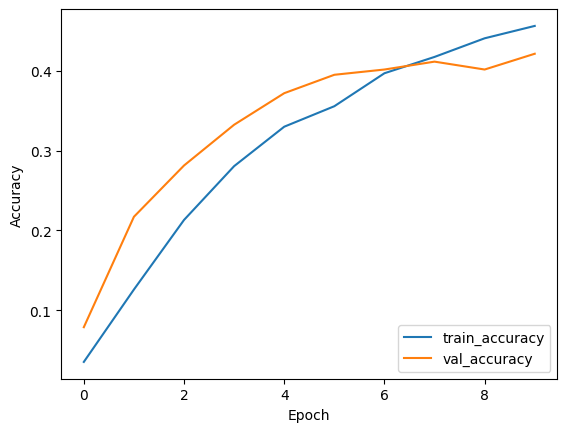

In [13]:

# model with dropout 0.2
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

model = create_model()
# larger learning rate
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(train_data, epochs=10, validation_data=val_data)

print_results()


Epoch 1/30


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


    227/Unknown 31s 99ms/step - accuracy: 0.0174 - loss: 4.5947

/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


227/227 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - accuracy: 0.0175 - loss: 4.5941 - val_accuracy: 0.1118 - val_loss: 3.8282
Epoch 2/30
227/227 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - accuracy: 0.1241 - loss: 3.9285 - val_accuracy: 0.2451 - val_loss: 3.2050
Epoch 3/30
227/227 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - accuracy: 0.2313 - loss: 3.3320 - val_accuracy: 0.2928 - val_loss: 2.8676
Epoch 4/30
227/227 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - accuracy: 0.3004 - loss: 2.9985 - val_accuracy: 0.3174 - val_loss: 2.7436
Epoch 5/30
227/227 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - accuracy: 0.3435 - loss: 2.7825 - val_accuracy: 0.3438 - val_loss: 2.6151
Epoch 6/30
227/227 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - accuracy: 0.3943 - loss: 2.5662 - val_accuracy: 0.3766 - val_loss: 2.5367
Epoch 7/30
227/227 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - accuracy: 0.4310 - loss: 2.3908 - val_accuracy: 0.3766 - val_loss: 2.5392
Epoch 8/30
227/227 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - accuracy: 0.4415 - loss: 2.3431 - val

2024-10-30 23:19:40.048692: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


227/227 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - accuracy: 0.5379 - loss: 1.8723 - val_accuracy: 0.4062 - val_loss: 2.4191
Epoch 15/30
227/227 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - accuracy: 0.5470 - loss: 1.8741 - val_accuracy: 0.4457 - val_loss: 2.3855
Epoch 16/30
227/227 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - accuracy: 0.5480 - loss: 1.8244 - val_accuracy: 0.4359 - val_loss: 2.4042
Epoch 17/30
227/227 ━━━━━━━━━━━━━━━━━━━━ 31s 104ms/step - accuracy: 0.5665 - loss: 1.7576 - val_accuracy: 0.4178 - val_loss: 2.4028
Epoch 18/30
227/227 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - accuracy: 0.5602 - loss: 1.7638 - val_accuracy: 0.4243 - val_loss: 2.4049
Epoch 19/30
227/227 ━━━━━━━━━━━━━━━━━━━━ 31s 104ms/step - accuracy: 0.5868 - loss: 1.6912 - val_accuracy: 0.4391 - val_loss: 2.4426
Epoch 20/30
227/227 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - accuracy: 0.5736 - loss: 1.7111 - val_accuracy: 0.4391 - val_loss: 2.3529
Epoch 21/30
227/227 ━━━━━━━━━━━━━━━━━━━━ 31s 106ms/step - accuracy: 0.5813 - loss: 1.664

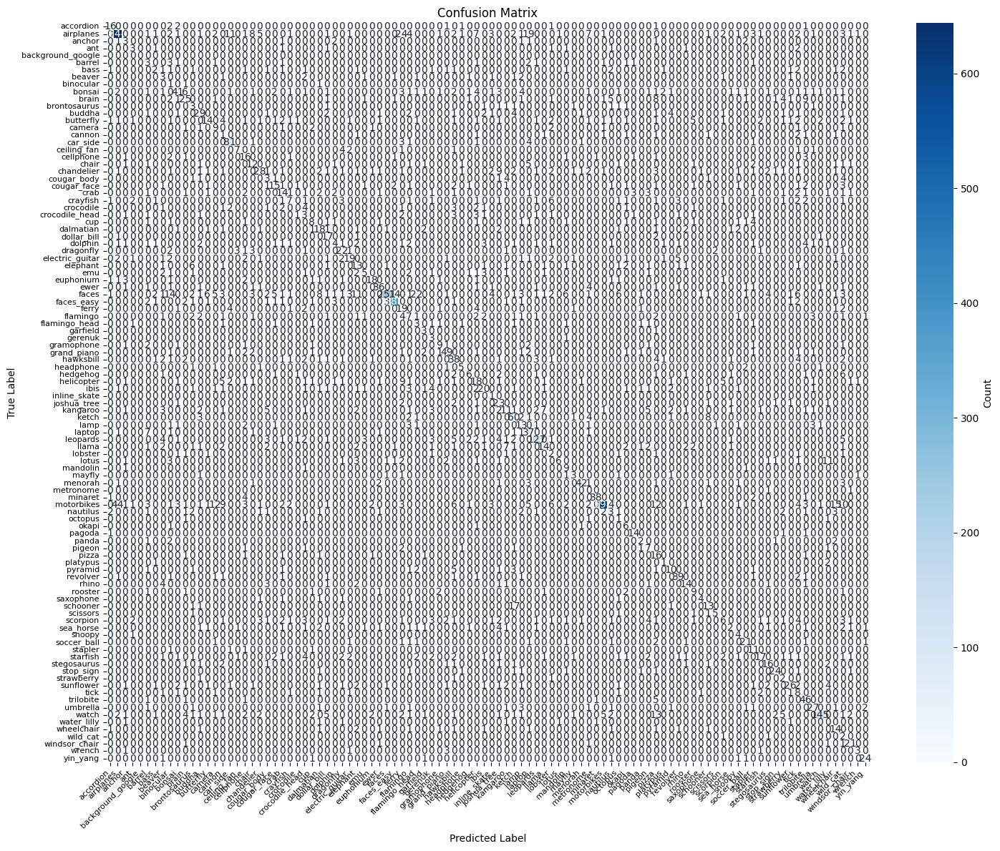

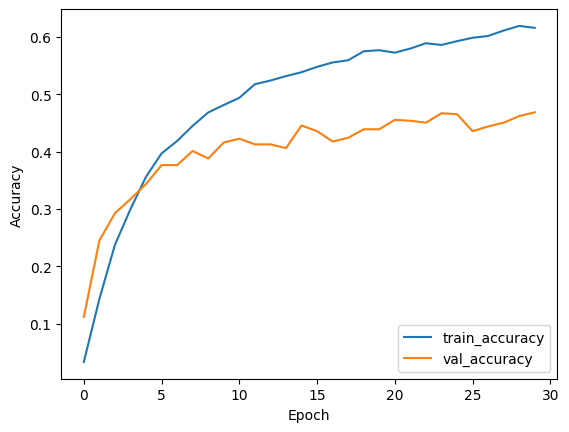

In [14]:

# model with dropout 0.2 + 30 epochs
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

model = create_model()
# larger learning rate
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(train_data, epochs=30, validation_data=val_data)

print_results()


Epoch 1/30


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


60/60 ━━━━━━━━━━━━━━━━━━━━ 15s 112ms/step - accuracy: 0.0061 - loss: 4.6457 - val_accuracy: 0.0016 - val_loss: 4.3783
Epoch 2/30
 1/60 ━━━━━━━━━━━━━━━━━━━━ 6s 104ms/step - accuracy: 0.0625 - loss: 4.6093

/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 109ms/step - accuracy: 0.0261 - loss: 4.5826 - val_accuracy: 0.0247 - val_loss: 4.2996
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 109ms/step - accuracy: 0.0309 - loss: 4.4610 - val_accuracy: 0.0477 - val_loss: 4.2188
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step - accuracy: 0.0652 - loss: 4.2501 - val_accuracy: 0.1365 - val_loss: 3.8721
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 14s 109ms/step - accuracy: 0.1172 - loss: 3.9694 - val_accuracy: 0.1678 - val_loss: 3.6225
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - accuracy: 0.1549 - loss: 3.7733 - val_accuracy: 0.1612 - val_loss: 3.5444
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - accuracy: 0.1637 - loss: 3.6453 - val_accuracy: 0.2401 - val_loss: 3.2109
Epoch 8/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - accuracy: 0.1954 - loss: 3.4605 - val_accuracy: 0.2385 - val_loss: 3.1901
Epoch 9/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - accuracy: 0.2405 - loss: 3.1966 - val_accuracy: 0.2697 - val_

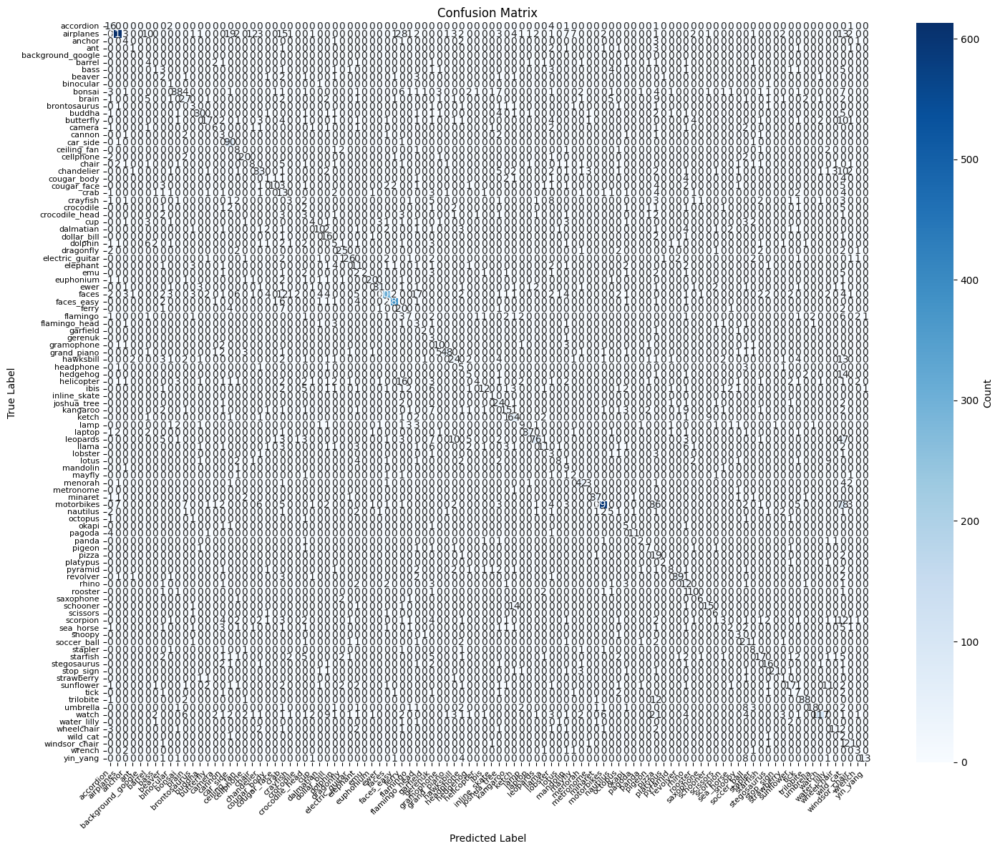

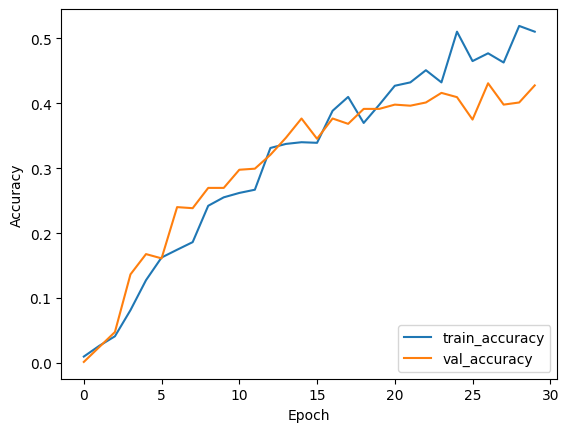

In [15]:
def create_model():
    
    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.Conv2D(32, (3, 3), activation='relu', 
                            input_shape=(128, 128, 1)))
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))
    model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))
    model.add(tf.keras.layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))   

    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.5))
    model.add(tf.keras.layers.Dense(128, activation='relu'))
    model.add(tf.keras.layers.Dense(len(class_names), activation='softmax'))

    model.compile(optimizer='rmsprop',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])    
    
    return model

model = create_model()
history = model.fit(train_data, steps_per_epoch=60, epochs=30, validation_data=val_data, validation_steps=20)

print_results()

Epoch 1/10


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


    227/Unknown 38s 130ms/step - accuracy: 0.0104 - loss: 4.6212

/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


227/227 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - accuracy: 0.0104 - loss: 4.6209 - val_accuracy: 0.0214 - val_loss: 4.2544
Epoch 2/10
227/227 ━━━━━━━━━━━━━━━━━━━━ 38s 134ms/step - accuracy: 0.0525 - loss: 4.2949 - val_accuracy: 0.1464 - val_loss: 3.6852
Epoch 3/10
227/227 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - accuracy: 0.1385 - loss: 3.7247 - val_accuracy: 0.2007 - val_loss: 3.3353
Epoch 4/10
227/227 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - accuracy: 0.2461 - loss: 3.1766 - val_accuracy: 0.3240 - val_loss: 2.8333
Epoch 5/10
227/227 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - accuracy: 0.3300 - loss: 2.7531 - val_accuracy: 0.3816 - val_loss: 2.5102
Epoch 6/10
227/227 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - accuracy: 0.4101 - loss: 2.3549 - val_accuracy: 0.3898 - val_loss: 2.4492
Epoch 7/10
227/227 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - accuracy: 0.4583 - loss: 2.1907 - val_accuracy: 0.4227 - val_loss: 2.4227
Epoch 8/10
227/227 ━━━━━━━━━━━━━━━━━━━━ 38s 135ms/step - accuracy: 0.5045 - loss: 1.9342 - val

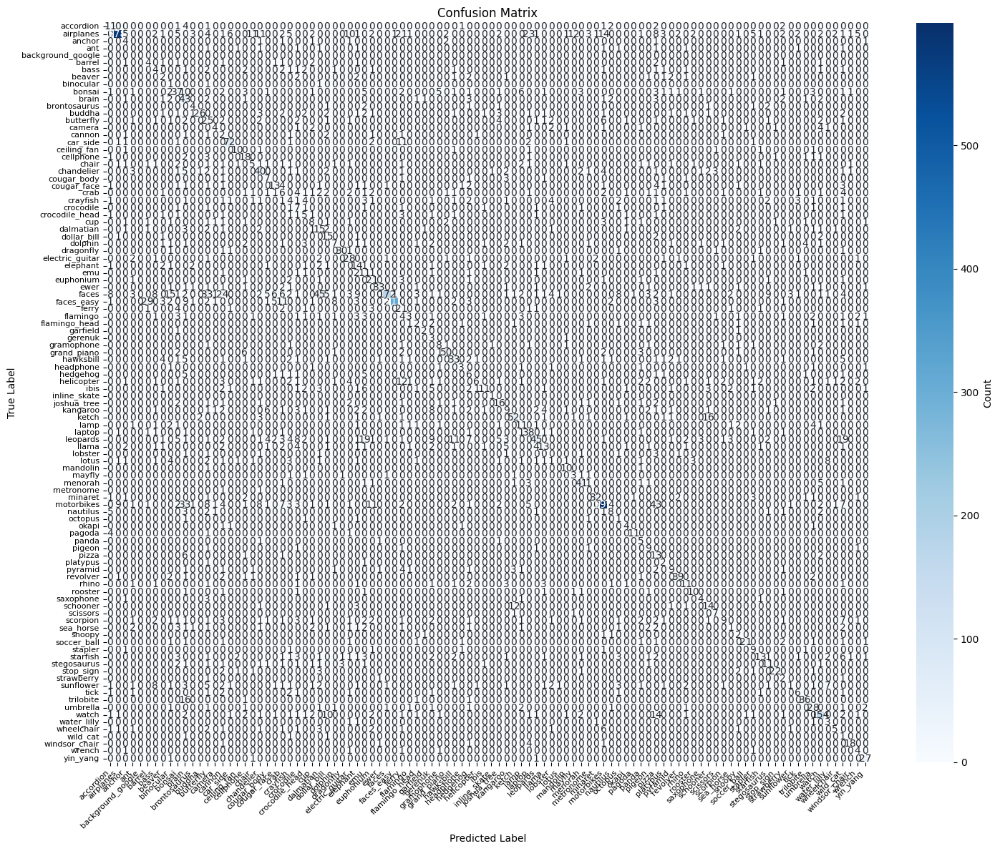

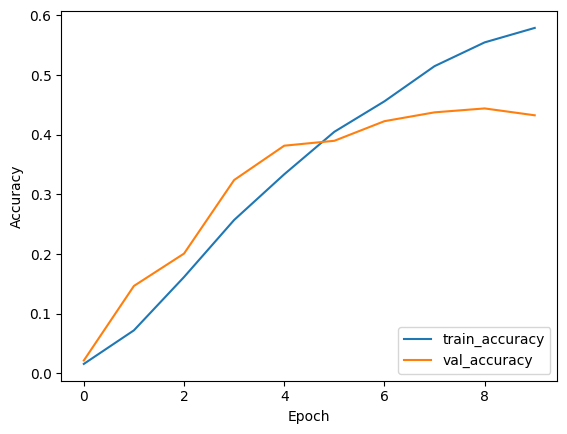

In [16]:
# model with more layers with more units

def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.MaxPooling2D((2, 2)),
    
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),        
        tf.keras.layers.Conv2D(256, (3, 3), activation='relu'),  # Increased depth and width
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(512, (3, 3), activation='relu'),  # Increased depth and width
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(256, activation='relu'),  # Increased dense layer size
        tf.keras.layers.Dropout(0.1),  # Higher dropout to regularize
        
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

model = create_model()
# larger learning rate
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(train_data, epochs=10, validation_data=val_data)

print_results()

Epoch 1/10


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


    227/Unknown 40s 140ms/step - accuracy: 0.0095 - loss: 4.6243

/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


227/227 ━━━━━━━━━━━━━━━━━━━━ 41s 144ms/step - accuracy: 0.0095 - loss: 4.6241 - val_accuracy: 0.0148 - val_loss: 4.2553
Epoch 2/10
227/227 ━━━━━━━━━━━━━━━━━━━━ 39s 141ms/step - accuracy: 0.0411 - loss: 4.3085 - val_accuracy: 0.1135 - val_loss: 3.8056
Epoch 3/10
227/227 ━━━━━━━━━━━━━━━━━━━━ 40s 141ms/step - accuracy: 0.1317 - loss: 3.7590 - val_accuracy: 0.2138 - val_loss: 3.2865
Epoch 4/10
227/227 ━━━━━━━━━━━━━━━━━━━━ 40s 144ms/step - accuracy: 0.2190 - loss: 3.2602 - val_accuracy: 0.2582 - val_loss: 3.0061
Epoch 5/10
227/227 ━━━━━━━━━━━━━━━━━━━━ 40s 143ms/step - accuracy: 0.3095 - loss: 2.8332 - val_accuracy: 0.3141 - val_loss: 2.6890
Epoch 6/10
227/227 ━━━━━━━━━━━━━━━━━━━━ 40s 143ms/step - accuracy: 0.3859 - loss: 2.4321 - val_accuracy: 0.3651 - val_loss: 2.5681
Epoch 7/10
227/227 ━━━━━━━━━━━━━━━━━━━━ 40s 144ms/step - accuracy: 0.4591 - loss: 2.1109 - val_accuracy: 0.3618 - val_loss: 2.5038
Epoch 8/10
227/227 ━━━━━━━━━━━━━━━━━━━━ 40s 143ms/step - accuracy: 0.5274 - loss: 1.8387 - val

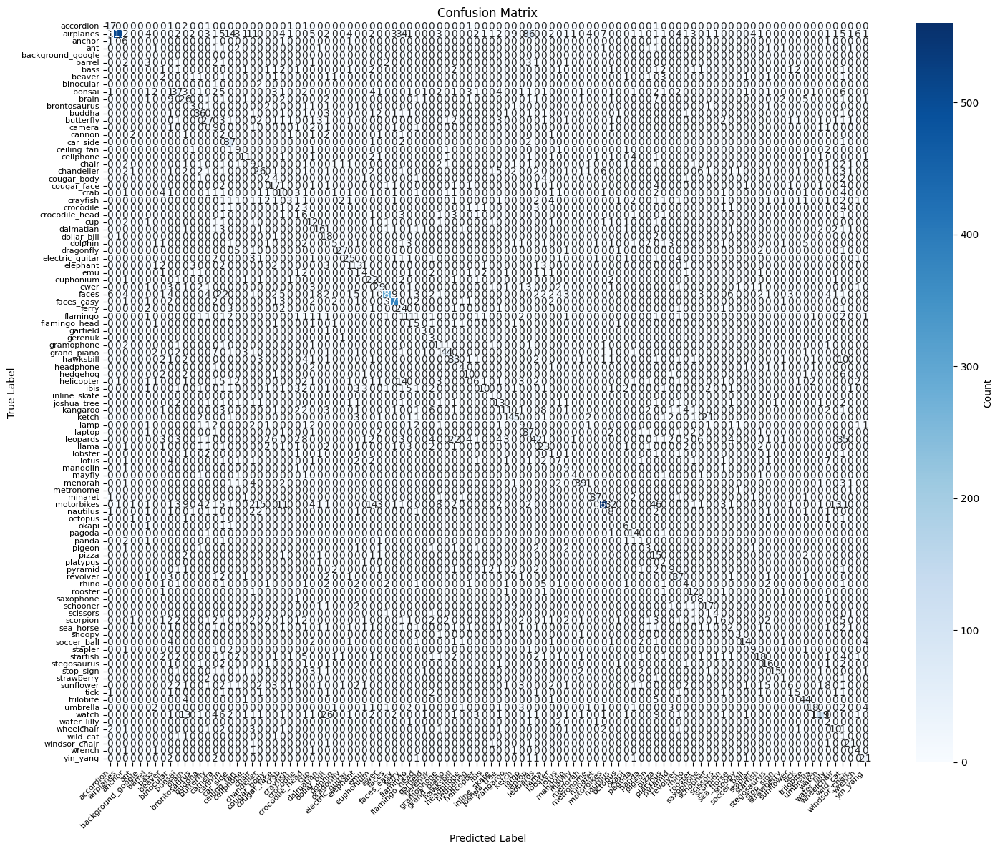

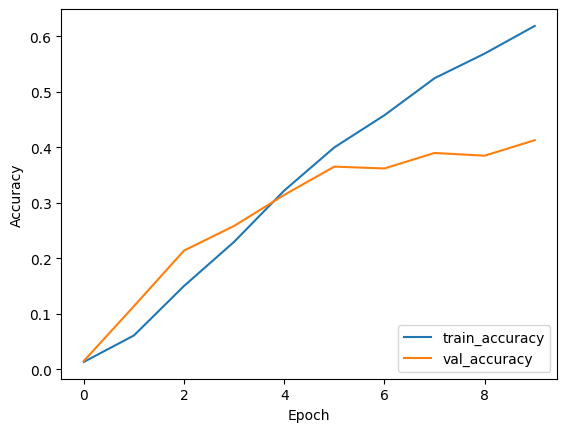

In [17]:
# model with more dropout and more layers with more units

def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.05),
        
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.05),
        
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.05),
        
        tf.keras.layers.Conv2D(256, (3, 3), activation='relu'),  # Increased depth and width
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.05),

        tf.keras.layers.Conv2D(512, (3, 3), activation='relu'),  # Increased depth and width
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.05),
        
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(1024, activation='relu'),  # Increased dense layer size
        tf.keras.layers.Dropout(0.1),  # Higher dropout to regularize
        
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

model = create_model()
# larger learning rate
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(train_data, epochs=10, validation_data=val_data)

print_results()

Epoch 1/10


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


    226/Unknown 19s 48ms/step - accuracy: 0.0136 - loss: 4.6051

/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


227/227 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step - accuracy: 0.0137 - loss: 4.6044 - val_accuracy: 0.0428 - val_loss: 4.1321
Epoch 2/10
227/227 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step - accuracy: 0.0809 - loss: 4.1890 - val_accuracy: 0.1530 - val_loss: 3.5615
Epoch 3/10
227/227 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step - accuracy: 0.1270 - loss: 3.7887 - val_accuracy: 0.2352 - val_loss: 3.2235
Epoch 4/10
227/227 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step - accuracy: 0.1882 - loss: 3.4836 - val_accuracy: 0.2780 - val_loss: 2.9745
Epoch 5/10
227/227 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step - accuracy: 0.2475 - loss: 3.1918 - val_accuracy: 0.3141 - val_loss: 2.6971
Epoch 6/10
227/227 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step - accuracy: 0.2869 - loss: 2.9725 - val_accuracy: 0.3470 - val_loss: 2.6226
Epoch 7/10
227/227 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step - accuracy: 0.3119 - loss: 2.8397 - val_accuracy: 0.3635 - val_loss: 2.4925
Epoch 8/10


2024-10-30 23:47:55.713410: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


227/227 ━━━━━━━━━━━━━━━━━━━━ 19s 51ms/step - accuracy: 0.3507 - loss: 2.6886 - val_accuracy: 0.3849 - val_loss: 2.4117
Epoch 9/10
227/227 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step - accuracy: 0.3765 - loss: 2.5193 - val_accuracy: 0.3766 - val_loss: 2.3989
Epoch 10/10
227/227 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step - accuracy: 0.3855 - loss: 2.4765 - val_accuracy: 0.3947 - val_loss: 2.2815
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step
Accuracy: 58.06%


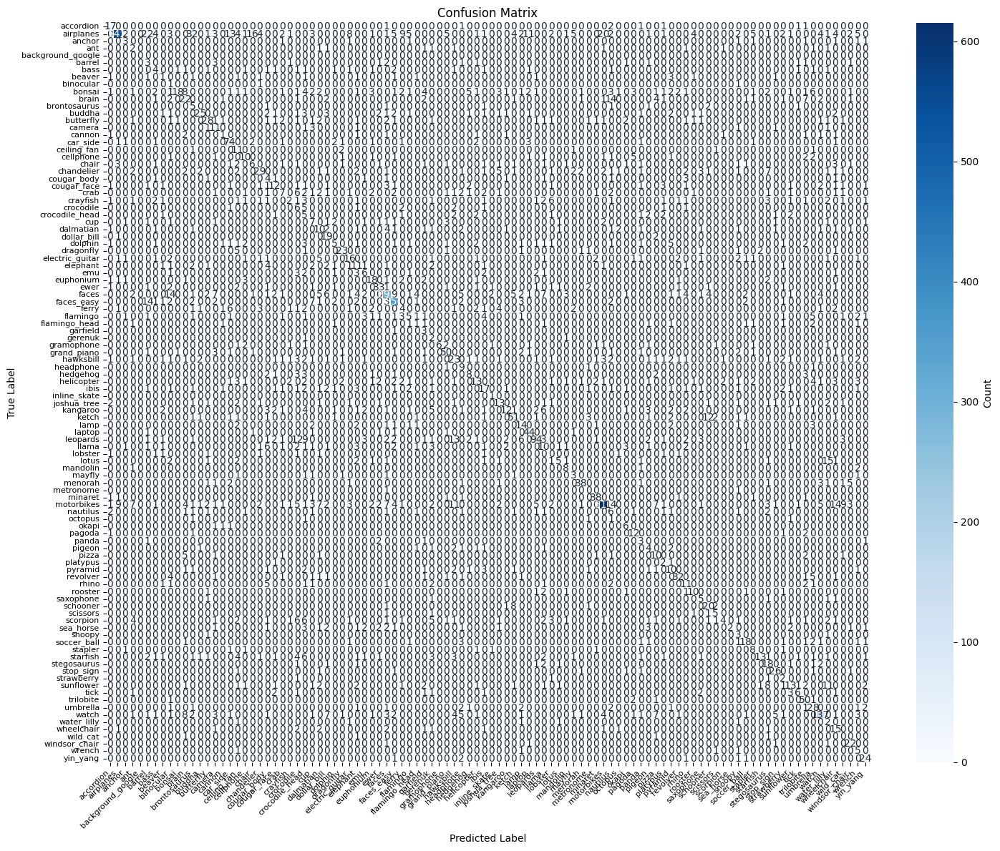

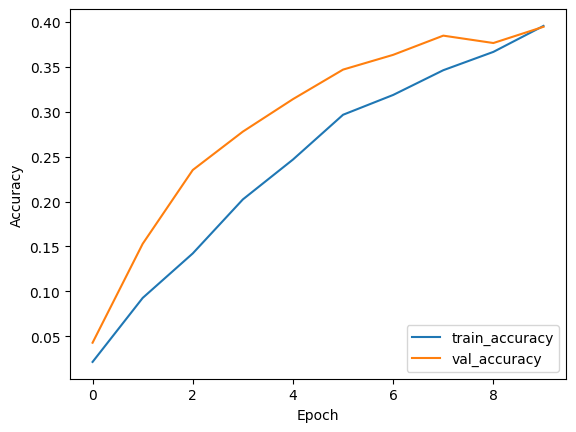

In [18]:

# model with dropout 0.2 and pooling 3x3
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.MaxPooling2D((3, 3)),
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((3, 3)),
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((3, 3)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

model = create_model()
# larger learning rate
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(train_data, epochs=10, validation_data=val_data)

print_results()


Epoch 1/20


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


    227/Unknown 31s 103ms/step - accuracy: 0.0222 - loss: 4.5574

/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


227/227 ━━━━━━━━━━━━━━━━━━━━ 32s 106ms/step - accuracy: 0.0223 - loss: 4.5567 - val_accuracy: 0.1283 - val_loss: 3.7353
Epoch 2/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - accuracy: 0.1349 - loss: 3.8251 - val_accuracy: 0.2780 - val_loss: 3.0543
Epoch 3/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - accuracy: 0.2627 - loss: 3.1870 - val_accuracy: 0.3273 - val_loss: 2.7491
Epoch 4/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 31s 104ms/step - accuracy: 0.3352 - loss: 2.8525 - val_accuracy: 0.3602 - val_loss: 2.6220
Epoch 5/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - accuracy: 0.3825 - loss: 2.6018 - val_accuracy: 0.3849 - val_loss: 2.5233
Epoch 6/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - accuracy: 0.4187 - loss: 2.4782 - val_accuracy: 0.3865 - val_loss: 2.4951
Epoch 7/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - accuracy: 0.4531 - loss: 2.3127 - val_accuracy: 0.4128 - val_loss: 2.5225
Epoch 8/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 31s 104ms/step - accuracy: 0.4774 - loss: 2.1684 - val

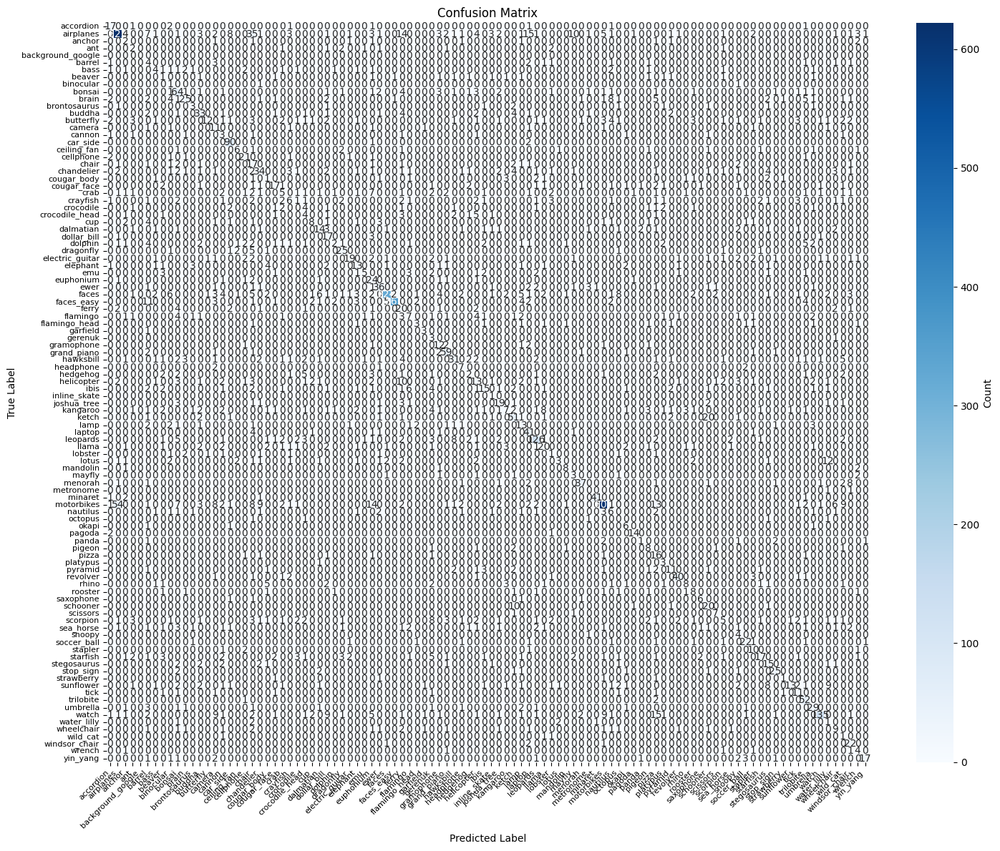

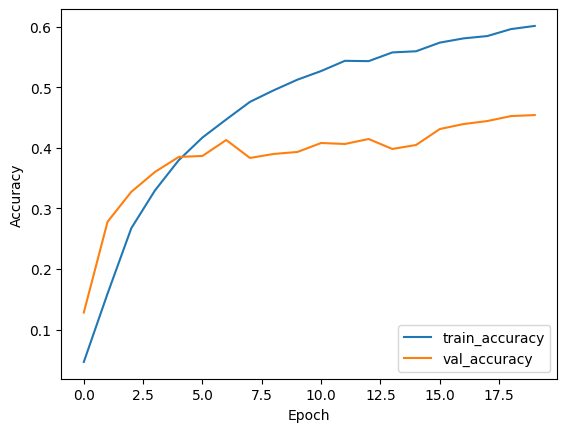

In [19]:

# model with dropout 0.2 and more epochs
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

model = create_model()
# larger learning rate
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(train_data, epochs=20, validation_data=val_data)

print_results()


Epoch 1/20


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


    227/Unknown 19s 47ms/step - accuracy: 0.0114 - loss: 4.6128

/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


227/227 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step - accuracy: 0.0115 - loss: 4.6125 - val_accuracy: 0.0559 - val_loss: 4.1551
Epoch 2/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step - accuracy: 0.0694 - loss: 4.1913 - val_accuracy: 0.1414 - val_loss: 3.5926
Epoch 3/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step - accuracy: 0.1494 - loss: 3.7039 - val_accuracy: 0.2368 - val_loss: 3.1432
Epoch 4/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step - accuracy: 0.2189 - loss: 3.3623 - val_accuracy: 0.2829 - val_loss: 2.9431
Epoch 5/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step - accuracy: 0.2572 - loss: 3.1552 - val_accuracy: 0.3372 - val_loss: 2.7190
Epoch 6/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step - accuracy: 0.2987 - loss: 2.9934 - val_accuracy: 0.3257 - val_loss: 2.7357
Epoch 7/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step - accuracy: 0.3104 - loss: 2.8480 - val_accuracy: 0.3668 - val_loss: 2.6105
Epoch 8/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 19s 51ms/step - accuracy: 0.3551 - loss: 2.6940 - val_accurac

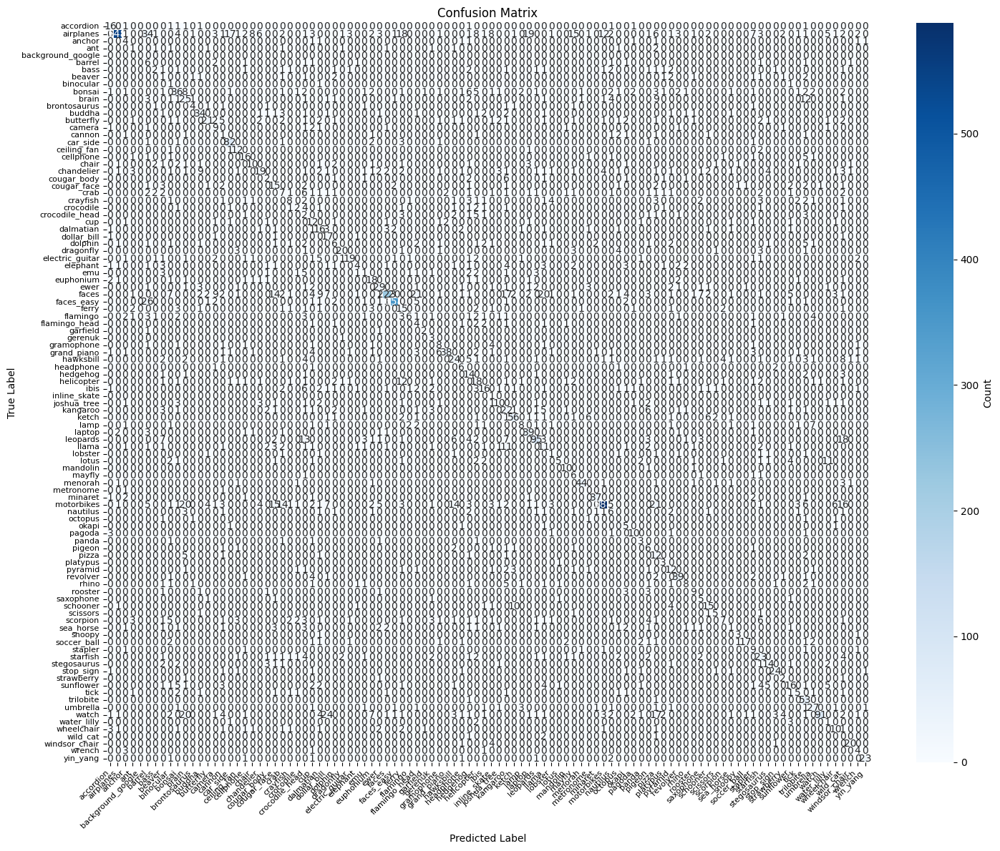

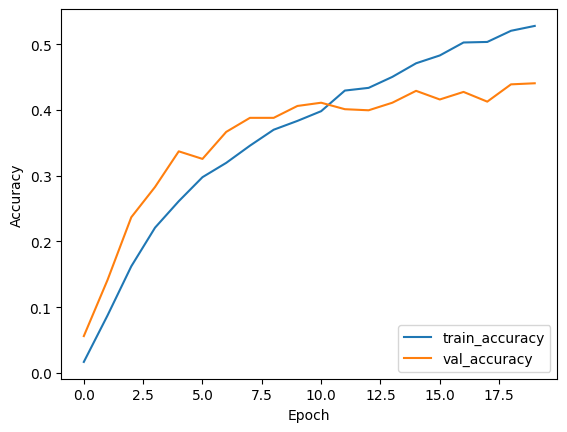

In [20]:
# model with dropout 0.2 and pooling 3x3 and more epochs
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.MaxPooling2D((3, 3)),
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((3, 3)),
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((3, 3)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

model = create_model()
# larger learning rate
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(train_data, epochs=20, validation_data=val_data)

print_results()

Epoch 1/20


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


    227/Unknown 54s 195ms/step - accuracy: 0.0397 - loss: 4.8717

/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


227/227 ━━━━━━━━━━━━━━━━━━━━ 55s 199ms/step - accuracy: 0.0398 - loss: 4.8700 - val_accuracy: 0.0066 - val_loss: 8.6804
Epoch 2/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 53s 199ms/step - accuracy: 0.1383 - loss: 3.8756 - val_accuracy: 0.0214 - val_loss: 11.1041
Epoch 3/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 53s 198ms/step - accuracy: 0.2413 - loss: 3.3101 - val_accuracy: 0.0773 - val_loss: 5.3469
Epoch 4/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 53s 199ms/step - accuracy: 0.3131 - loss: 2.9063 - val_accuracy: 0.2418 - val_loss: 3.2997
Epoch 5/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 53s 198ms/step - accuracy: 0.3701 - loss: 2.6789 - val_accuracy: 0.2632 - val_loss: 3.4275
Epoch 6/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 53s 199ms/step - accuracy: 0.4232 - loss: 2.4270 - val_accuracy: 0.3454 - val_loss: 2.7295
Epoch 7/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 52s 197ms/step - accuracy: 0.4581 - loss: 2.2740 - val_accuracy: 0.3931 - val_loss: 2.4040
Epoch 8/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 52s 197ms/step - accuracy: 0.5025 - loss: 2.0649 - va

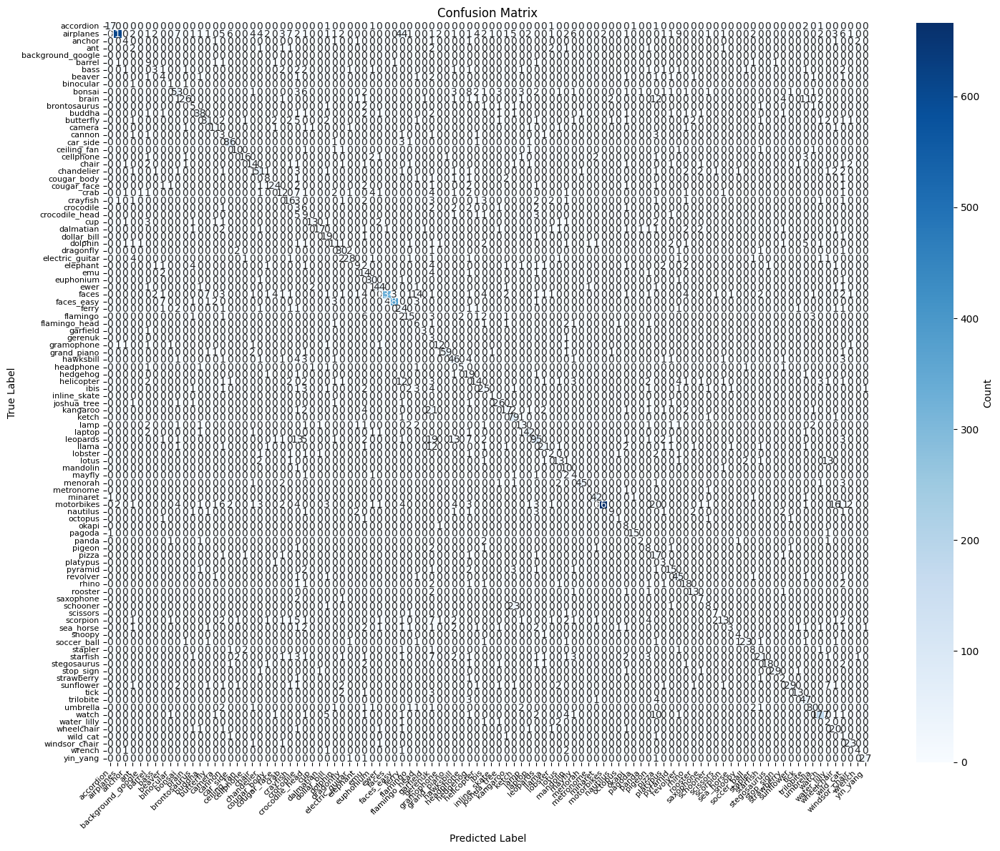

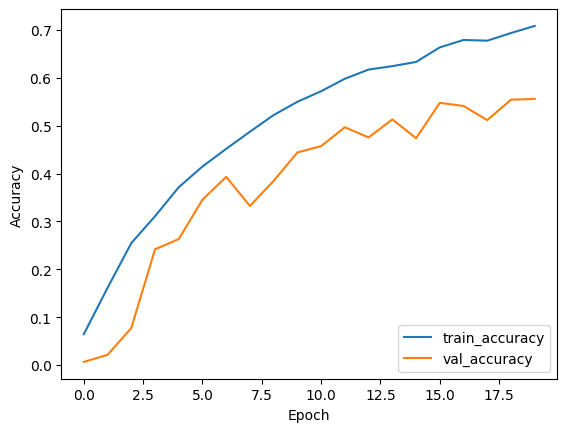

In [21]:
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.25),

        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.25),

        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3),

        tf.keras.layers.Conv2D(256, (3, 3), activation='relu'),  # Additional layer
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3),

        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(256, activation='relu'),  # Increased dense layer size
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(0.4),  # Higher dropout to regularize

        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

# Compile with a lower learning rate
model = create_model()
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005), 
              loss='sparse_categorical_crossentropy', 
              metrics=['accuracy'])

history = model.fit(train_data, epochs=20, validation_data=val_data)

print_results()


Epoch 1/20


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


    227/Unknown 56s 210ms/step - accuracy: 0.0276 - loss: 4.5462

/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


227/227 ━━━━━━━━━━━━━━━━━━━━ 57s 215ms/step - accuracy: 0.0278 - loss: 4.5451 - val_accuracy: 0.1694 - val_loss: 3.5381
Epoch 2/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 56s 215ms/step - accuracy: 0.2124 - loss: 3.4884 - val_accuracy: 0.2895 - val_loss: 2.9088
Epoch 3/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 56s 213ms/step - accuracy: 0.3346 - loss: 2.8612 - val_accuracy: 0.3240 - val_loss: 2.7368
Epoch 4/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 57s 217ms/step - accuracy: 0.4104 - loss: 2.4905 - val_accuracy: 0.3240 - val_loss: 2.8212
Epoch 5/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 57s 216ms/step - accuracy: 0.4580 - loss: 2.2894 - val_accuracy: 0.3816 - val_loss: 2.6011
Epoch 6/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 56s 214ms/step - accuracy: 0.5008 - loss: 2.1050 - val_accuracy: 0.3914 - val_loss: 2.5352
Epoch 7/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 56s 213ms/step - accuracy: 0.5224 - loss: 2.0169 - val_accuracy: 0.4079 - val_loss: 2.4834
Epoch 8/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 56s 214ms/step - accuracy: 0.5361 - loss: 1.9168 - val

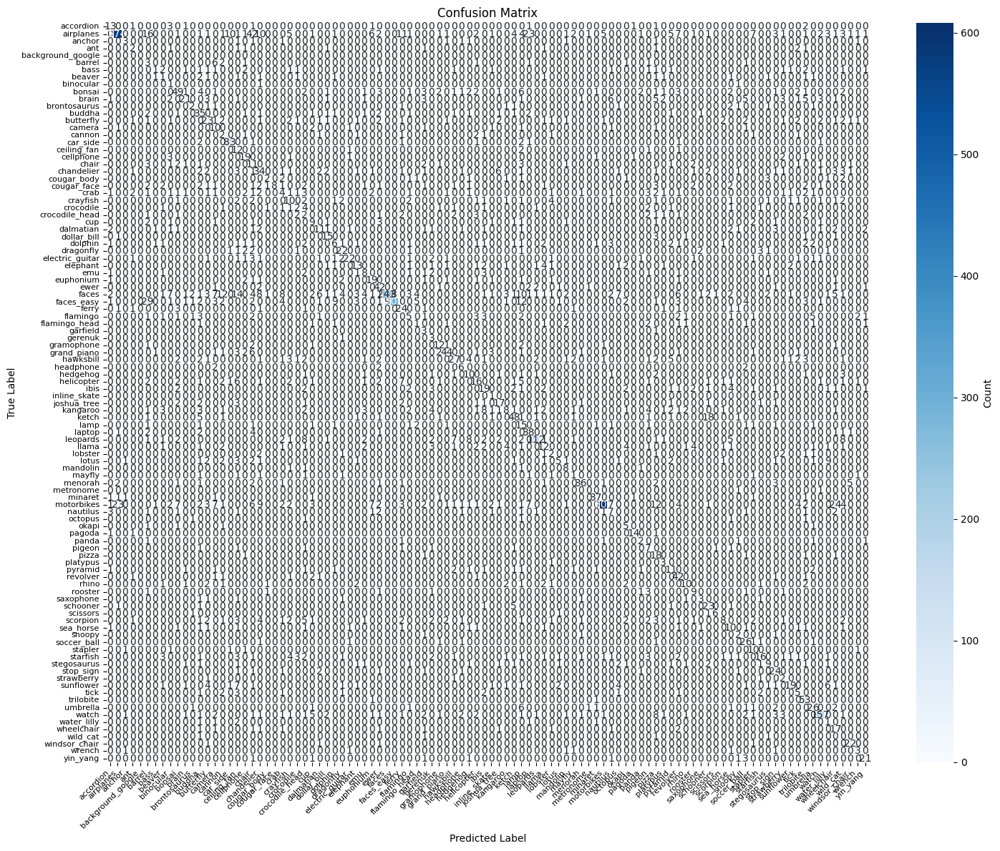

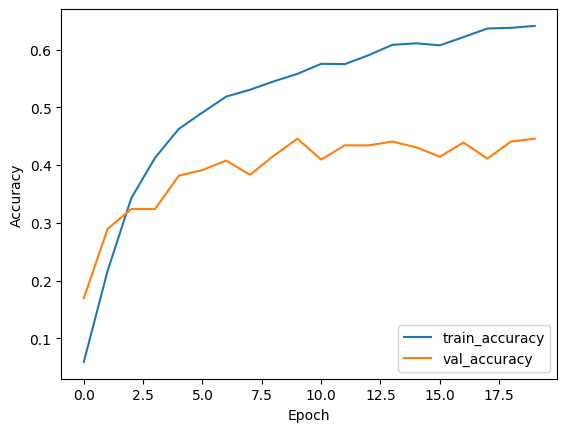

In [22]:
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(256, activation='relu'),  # Reduced dense layer size
        tf.keras.layers.Dropout(0.1),  # Increased dropout rate
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model


lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.001,
    decay_steps=10000,
    decay_rate=0.9)


model = create_model()
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr_schedule), 
              loss='sparse_categorical_crossentropy', 
              metrics=['accuracy'])

history = model.fit(train_data, epochs=20, validation_data=val_data)

print_results()

Epoch 1/20


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


    227/Unknown 57s 212ms/step - accuracy: 0.0280 - loss: 4.6230

/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


227/227 ━━━━━━━━━━━━━━━━━━━━ 58s 217ms/step - accuracy: 0.0282 - loss: 4.6218 - val_accuracy: 0.1612 - val_loss: 3.6608
Epoch 2/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 56s 214ms/step - accuracy: 0.1937 - loss: 3.5139 - val_accuracy: 0.2895 - val_loss: 2.9219
Epoch 3/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 57s 217ms/step - accuracy: 0.3131 - loss: 2.9396 - val_accuracy: 0.2993 - val_loss: 2.8729
Epoch 4/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 57s 216ms/step - accuracy: 0.3819 - loss: 2.6622 - val_accuracy: 0.3536 - val_loss: 2.6992
Epoch 5/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 56s 214ms/step - accuracy: 0.4347 - loss: 2.4443 - val_accuracy: 0.3454 - val_loss: 2.7764
Epoch 6/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 56s 215ms/step - accuracy: 0.4738 - loss: 2.2554 - val_accuracy: 0.3734 - val_loss: 2.6468
Epoch 7/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 56s 215ms/step - accuracy: 0.4958 - loss: 2.1309 - val_accuracy: 0.3750 - val_loss: 2.6441
Epoch 8/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 57s 214ms/step - accuracy: 0.5060 - loss: 2.0804 - val

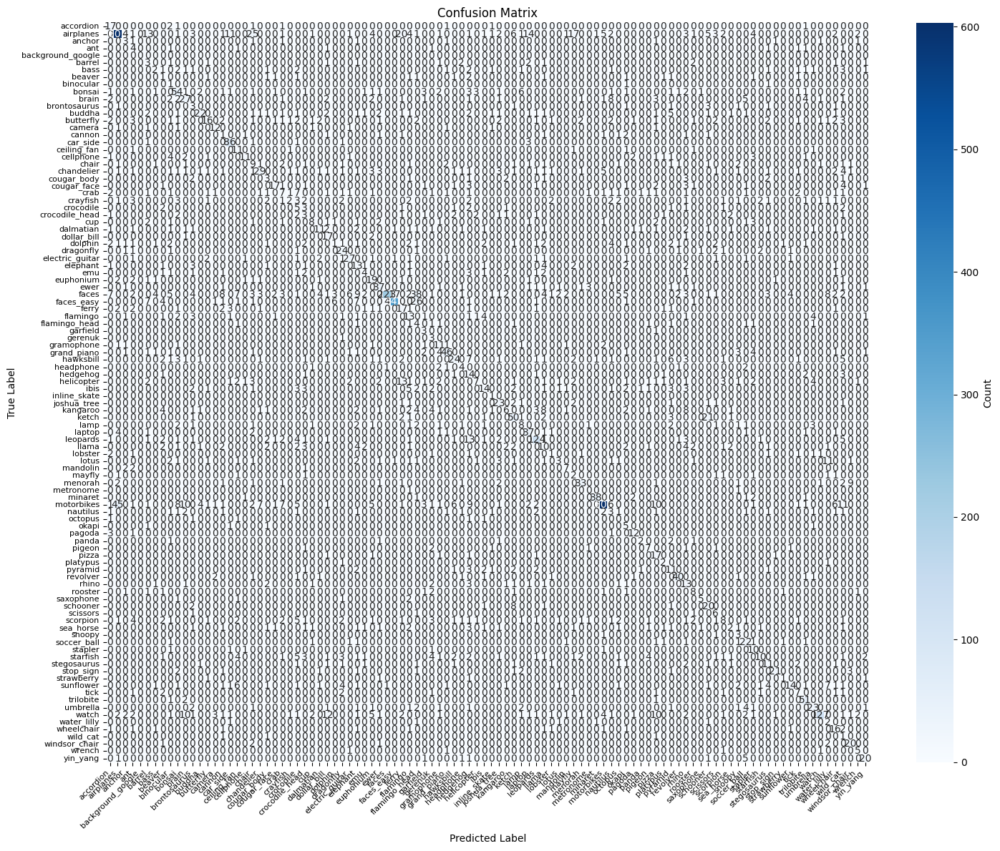

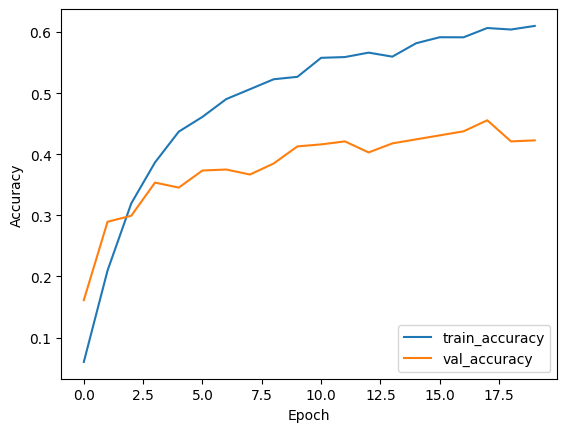

In [23]:
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(256, activation='relu'),  # Reduced dense layer size
        tf.keras.layers.Dropout(0.1),  # Increased dropout rate
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model


lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.001,
    decay_steps=10000,
    decay_rate=0.9)


model = create_model()
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr_schedule), 
              loss='sparse_categorical_crossentropy', 
              metrics=['accuracy'])

history = model.fit(train_data, epochs=20, validation_data=val_data)

print_results()

Epoch 1/20


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


    227/Unknown 51s 185ms/step - accuracy: 0.0158 - loss: 4.7077

/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


227/227 ━━━━━━━━━━━━━━━━━━━━ 52s 189ms/step - accuracy: 0.0159 - loss: 4.7071 - val_accuracy: 0.0066 - val_loss: 6.0774
Epoch 2/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 50s 187ms/step - accuracy: 0.0442 - loss: 4.3709 - val_accuracy: 0.0115 - val_loss: 6.1832
Epoch 3/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 50s 189ms/step - accuracy: 0.0660 - loss: 4.1796 - val_accuracy: 0.0164 - val_loss: 4.8609
Epoch 4/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 50s 187ms/step - accuracy: 0.0860 - loss: 4.0451 - val_accuracy: 0.0576 - val_loss: 4.2018
Epoch 5/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 50s 185ms/step - accuracy: 0.1064 - loss: 3.9150 - val_accuracy: 0.1382 - val_loss: 3.7785
Epoch 6/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 50s 186ms/step - accuracy: 0.1239 - loss: 3.7794 - val_accuracy: 0.1513 - val_loss: 3.6038
Epoch 7/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 50s 187ms/step - accuracy: 0.1542 - loss: 3.6515 - val_accuracy: 0.1069 - val_loss: 3.7915
Epoch 8/20
227/227 ━━━━━━━━━━━━━━━━━━━━ 50s 186ms/step - accuracy: 0.1556 - loss: 3.5592 - val

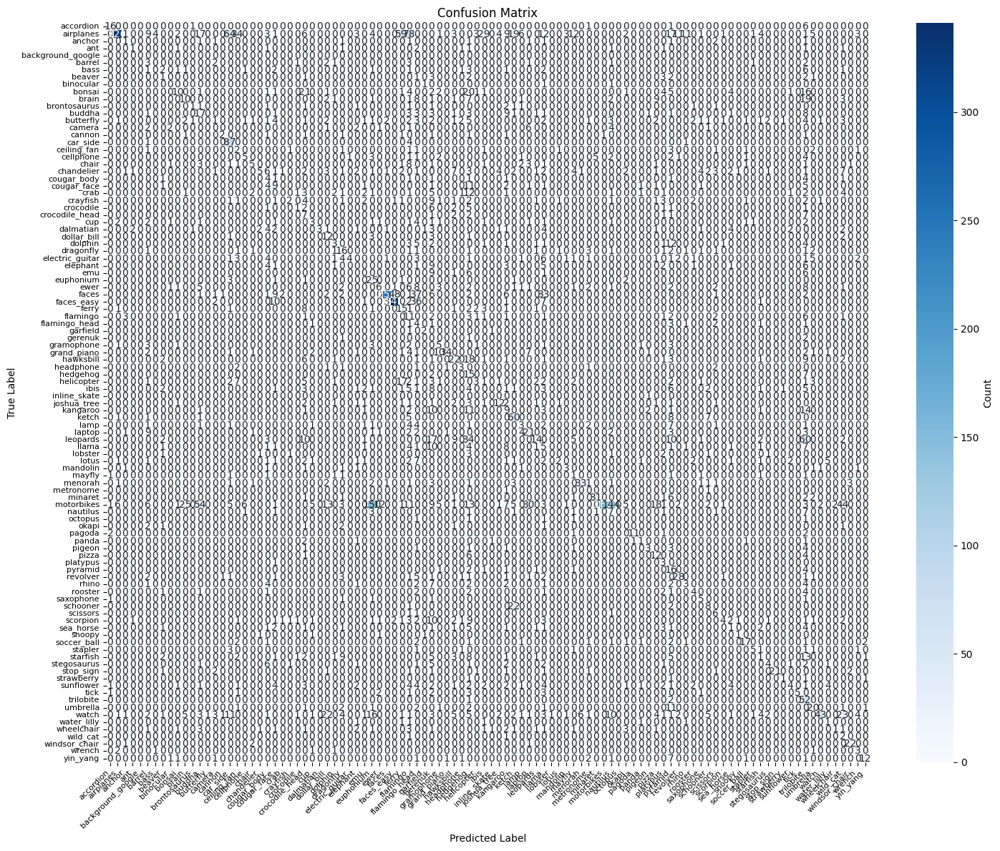

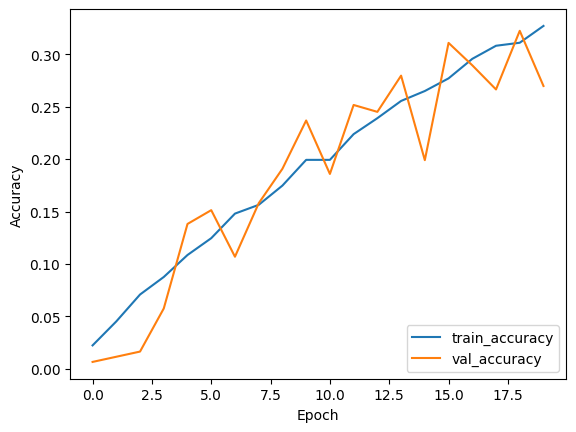

In [24]:
def create_improved_model():
    model = tf.keras.models.Sequential([
        # First Convolutional Block
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3),  # Regularization

        # Second Convolutional Block
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3),

        # Third Convolutional Block
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.4),

        # Fourth Convolutional Block for Deeper Feature Extraction
        tf.keras.layers.Conv2D(256, (3, 3), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.4),

        # Global Average Pooling instead of Flattening
        tf.keras.layers.GlobalAveragePooling2D(),

        # Fully Connected Layer
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.5),  # Dropout for Dense layer

        # Output Layer
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.0005,
    decay_steps=10000,
    decay_rate=0.9)

# Instantiate and compile the improved model
model = create_improved_model()
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr_schedule),  # Reduced learning rate for stability
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Training the model
history = model.fit(train_data, epochs=20, validation_data=val_data)
print_results()

Epoch 1/35


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


    227/Unknown 63s 232ms/step - accuracy: 0.0219 - loss: 5.3825

/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


227/227 ━━━━━━━━━━━━━━━━━━━━ 64s 237ms/step - accuracy: 0.0219 - loss: 5.3810 - val_accuracy: 0.0099 - val_loss: 9.8844
Epoch 2/35
227/227 ━━━━━━━━━━━━━━━━━━━━ 63s 241ms/step - accuracy: 0.0619 - loss: 4.4882 - val_accuracy: 0.0066 - val_loss: 9.8225
Epoch 3/35
227/227 ━━━━━━━━━━━━━━━━━━━━ 60s 231ms/step - accuracy: 0.1133 - loss: 4.0953 - val_accuracy: 0.0214 - val_loss: 7.0720
Epoch 4/35
227/227 ━━━━━━━━━━━━━━━━━━━━ 57s 218ms/step - accuracy: 0.1631 - loss: 3.7299 - val_accuracy: 0.0395 - val_loss: 5.1711
Epoch 5/35
227/227 ━━━━━━━━━━━━━━━━━━━━ 58s 221ms/step - accuracy: 0.2101 - loss: 3.4114 - val_accuracy: 0.0938 - val_loss: 4.5713
Epoch 6/35
227/227 ━━━━━━━━━━━━━━━━━━━━ 58s 221ms/step - accuracy: 0.2482 - loss: 3.1819 - val_accuracy: 0.1793 - val_loss: 3.6337
Epoch 7/35
227/227 ━━━━━━━━━━━━━━━━━━━━ 58s 220ms/step - accuracy: 0.2975 - loss: 2.9410 - val_accuracy: 0.2352 - val_loss: 3.4036
Epoch 8/35
227/227 ━━━━━━━━━━━━━━━━━━━━ 58s 221ms/step - accuracy: 0.3375 - loss: 2.7531 - val

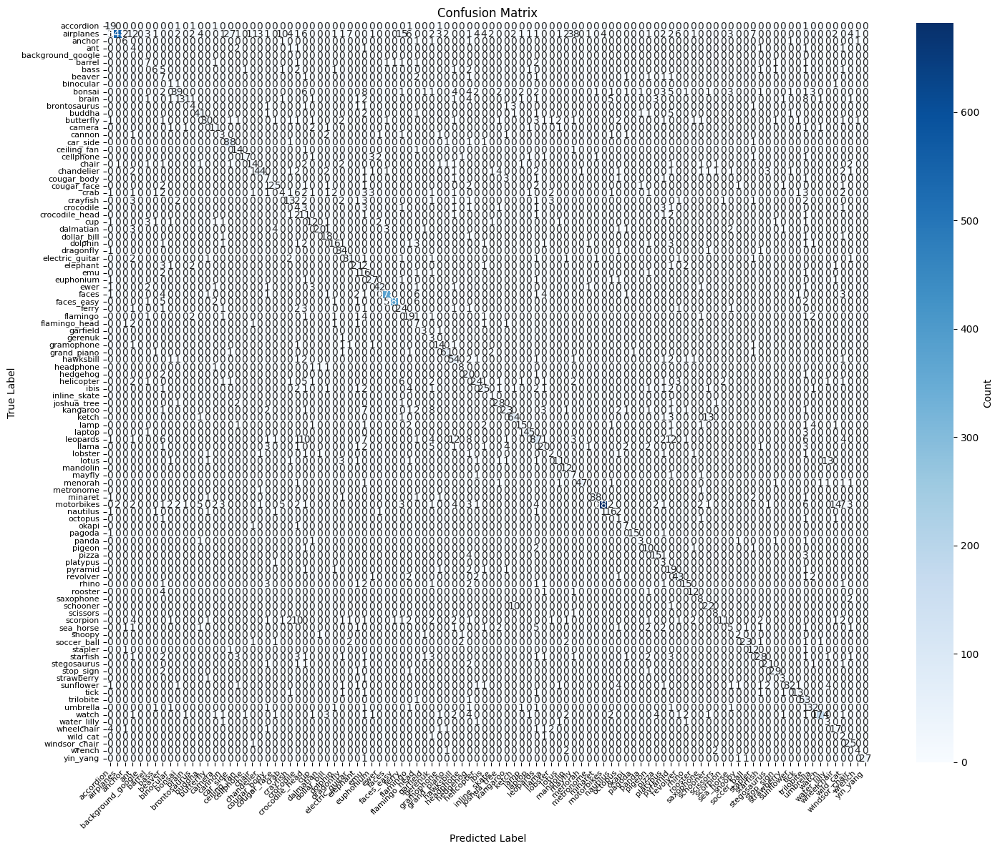

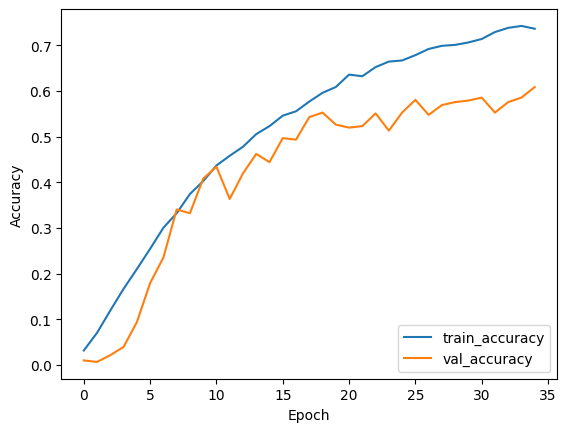

In [26]:
# this is the model that got 70% acc before, let's give it more epochs
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3), # Higher dropout to regularize

        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3), # Higher dropout to regularize

        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3), # Higher dropout to regularize

        tf.keras.layers.Conv2D(256, (3, 3), activation='relu'),  
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3), # Higher dropout to regularize

        tf.keras.layers.Conv2D(512, (3, 3), activation='relu'),  # more layers respect to original 70% model
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3),

        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(256, activation='relu'), 
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(0.5),  # Higher dropout to regularize

        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

# Compile with a lower learning rate
model = create_model()
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005), 
              loss='sparse_categorical_crossentropy', 
              metrics=['accuracy'])

history = model.fit(train_data, epochs=35, validation_data=val_data) # more epochs

print_results()


Epoch 1/35


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


    227/Unknown 62s 227ms/step - accuracy: 0.0309 - loss: 5.2275

/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


227/227 ━━━━━━━━━━━━━━━━━━━━ 63s 232ms/step - accuracy: 0.0310 - loss: 5.2258 - val_accuracy: 0.0082 - val_loss: 9.3589
Epoch 2/35
227/227 ━━━━━━━━━━━━━━━━━━━━ 60s 227ms/step - accuracy: 0.1071 - loss: 4.1963 - val_accuracy: 0.0099 - val_loss: 7.3498
Epoch 3/35
227/227 ━━━━━━━━━━━━━━━━━━━━ 59s 225ms/step - accuracy: 0.1633 - loss: 3.7012 - val_accuracy: 0.0543 - val_loss: 5.0872
Epoch 4/35
227/227 ━━━━━━━━━━━━━━━━━━━━ 59s 224ms/step - accuracy: 0.2487 - loss: 3.2162 - val_accuracy: 0.2319 - val_loss: 3.4108
Epoch 5/35
227/227 ━━━━━━━━━━━━━━━━━━━━ 61s 233ms/step - accuracy: 0.2944 - loss: 2.9155 - val_accuracy: 0.3141 - val_loss: 2.7538
Epoch 6/35
227/227 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.3624 - loss: 2.6276 - val_accuracy: 0.3914 - val_loss: 2.3241
Epoch 7/35
227/227 ━━━━━━━━━━━━━━━━━━━━ 60s 232ms/step - accuracy: 0.3905 - loss: 2.4816 - val_accuracy: 0.4803 - val_loss: 1.9549
Epoch 8/35
227/227 ━━━━━━━━━━━━━━━━━━━━ 58s 221ms/step - accuracy: 0.4184 - loss: 2.3421 - val

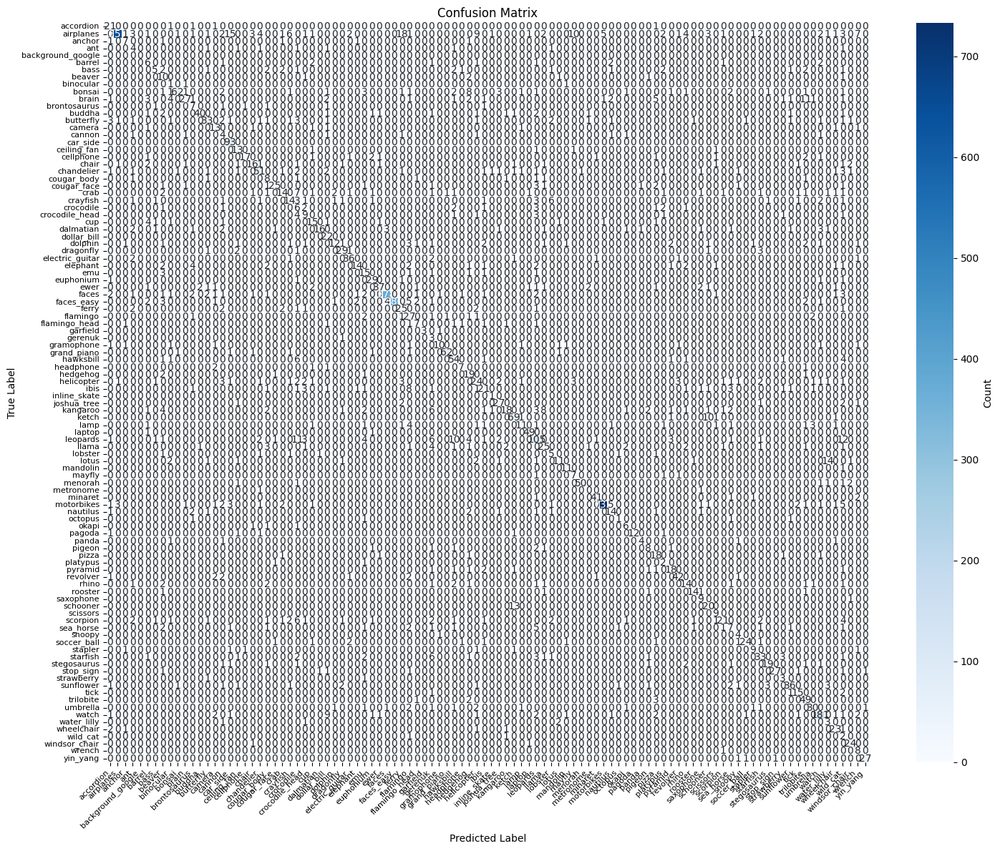

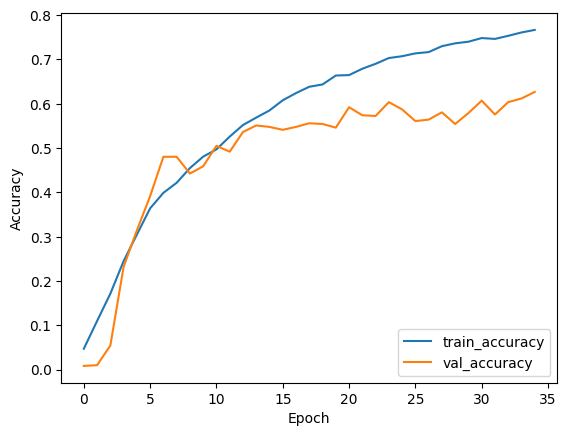

In [27]:
# this is the same as the model right above but with a changing learning rate
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3), # Higher dropout to regularize

        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3), # Higher dropout to regularize

        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3), # Higher dropout to regularize

        tf.keras.layers.Conv2D(256, (3, 3), activation='relu'),  
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3), # Higher dropout to regularize

        tf.keras.layers.Conv2D(512, (3, 3), activation='relu'),  # more layers respect to original 70% model
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3),

        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(256, activation='relu'), 
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(0.5),  # Higher dropout to regularize

        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.001,
    decay_steps=5000,
    decay_rate=0.95)

# Compile with a lower learning rate
model = create_model()
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr_schedule), 
              loss='sparse_categorical_crossentropy', 
              metrics=['accuracy'])

history = model.fit(train_data, epochs=35, validation_data=val_data) # more epochs

print_results()


Epoch 1/35


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


    227/Unknown 56s 202ms/step - accuracy: 0.0469 - loss: 4.8220

/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


227/227 ━━━━━━━━━━━━━━━━━━━━ 57s 206ms/step - accuracy: 0.0471 - loss: 4.8201 - val_accuracy: 0.0082 - val_loss: 12.5383
Epoch 2/35
227/227 ━━━━━━━━━━━━━━━━━━━━ 53s 200ms/step - accuracy: 0.1749 - loss: 3.6783 - val_accuracy: 0.0230 - val_loss: 6.5705
Epoch 3/35
227/227 ━━━━━━━━━━━━━━━━━━━━ 54s 203ms/step - accuracy: 0.2577 - loss: 3.1531 - val_accuracy: 0.1793 - val_loss: 3.5305
Epoch 4/35
227/227 ━━━━━━━━━━━━━━━━━━━━ 53s 198ms/step - accuracy: 0.3305 - loss: 2.8612 - val_accuracy: 0.3010 - val_loss: 2.9745
Epoch 5/35
227/227 ━━━━━━━━━━━━━━━━━━━━ 59s 224ms/step - accuracy: 0.3917 - loss: 2.5527 - val_accuracy: 0.4079 - val_loss: 2.7590
Epoch 6/35
227/227 ━━━━━━━━━━━━━━━━━━━━ 57s 215ms/step - accuracy: 0.4334 - loss: 2.3760 - val_accuracy: 0.4062 - val_loss: 2.3982
Epoch 7/35
227/227 ━━━━━━━━━━━━━━━━━━━━ 56s 214ms/step - accuracy: 0.4493 - loss: 2.2312 - val_accuracy: 0.3947 - val_loss: 2.4038
Epoch 8/35
227/227 ━━━━━━━━━━━━━━━━━━━━ 56s 212ms/step - accuracy: 0.5134 - loss: 1.9930 - va

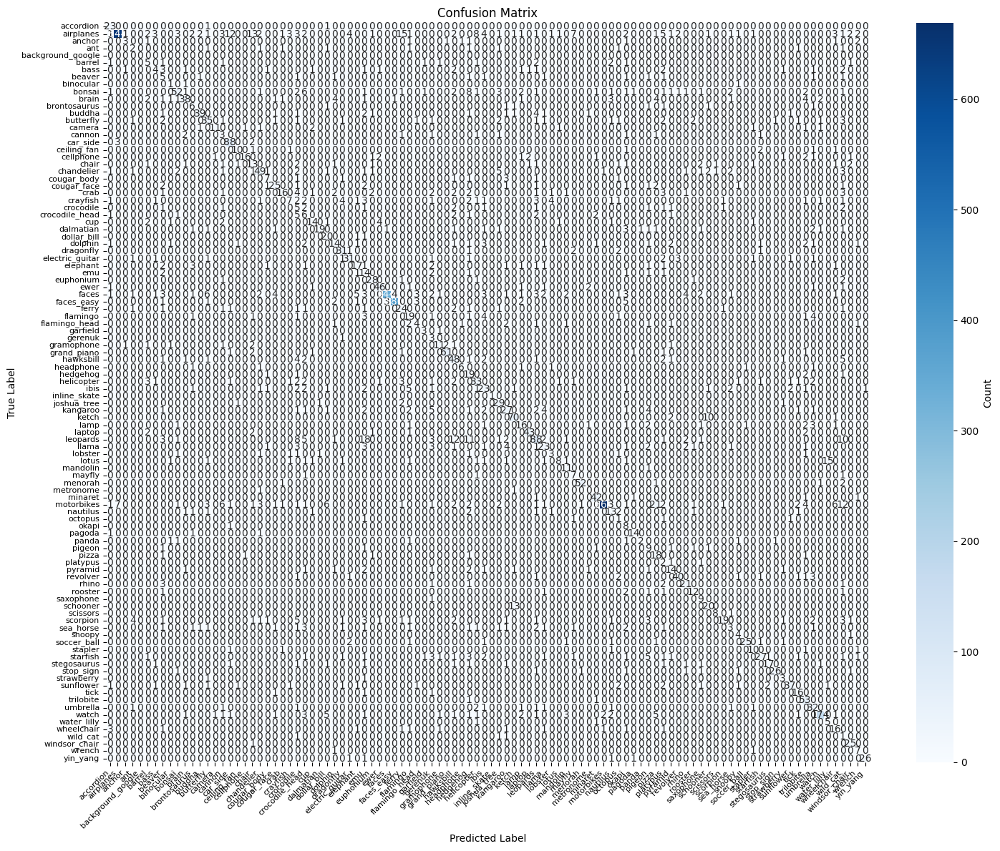

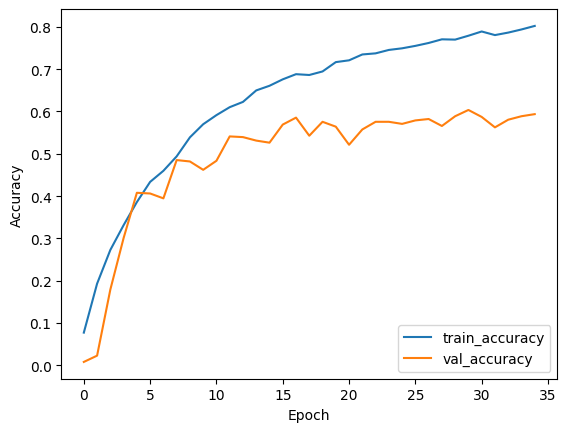

In [28]:
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.25),

        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.25),

        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3),

        tf.keras.layers.Conv2D(256, (3, 3), activation='relu'),  # Additional layer
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3),

        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(256, activation='relu'),  # Increased dense layer size
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(0.4),  # Higher dropout to regularize

        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

# Compile with a lower learning rate
model = create_model()
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005), 
              loss='sparse_categorical_crossentropy', 
              metrics=['accuracy'])

history = model.fit(train_data, epochs=35, validation_data=val_data)

print_results()
